## GP Models - Intent Only (all patients)

In [19]:
from platform import python_version
print(python_version())

3.10.6


In [31]:
# libraries 

import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import TimeSeriesSplit
from sklearn import metrics
from sklearn.preprocessing import StandardScaler
import math
from sklearn import gaussian_process
from sklearn.gaussian_process.kernels import ConstantKernel, Matern, RBF, WhiteKernel, ExpSineSquared
import warnings
from functools import partial
import scipy.optimize
from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

np.seterr(divide = 'ignore') 

{'divide': 'ignore', 'over': 'warn', 'under': 'ignore', 'invalid': 'warn'}

In [32]:
# data 
u01 = pd.read_csv("data/intent_affect_lagged_021623.csv", low_memory = False)

# drop NA columns 
u01 = u01[u01['sitb_si_intent'].notna()]

u01.head(5)

,session_id,ppt_id,data_collection_start,survey_name,phase,started_at,ended_at,status,day_in_study,affect_agitated,...,lag_numb,lag_overwhelmed,lag_positive,lag_relaxed,lag_sad,lag_self_hate,lag_stressed,lag_tense,lag_trapped,lag_worried
0,23813.0,u01-fc010,2019-10-08T04:00:00Z,Daytime Survey,Phase 1,2019-10-08T19:49:19Z,2019-10-08T19:56:55Z,1,0,3.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,23824.0,u01-fc010,2019-10-08T04:00:00Z,Daytime Survey,Phase 1,2019-10-08T21:42:54Z,2019-10-08T21:45:17Z,1,0,2.0,...,7.0,NaN,4.0,4.0,2.0,0.0,7.0,6.0,1.0,4.0
2,23876.0,u01-fc010,2019-10-08T04:00:00Z,Nighttime Survey,Phase 1,2019-10-09T09:41:37Z,2019-10-09T09:44:55Z,1,1,1.0,...,6.0,NaN,3.0,1.0,0.0,0.0,3.0,2.0,0.0,2.0
3,23863.0,u01-fc010,2019-10-08T04:00:00Z,Morning Survey,Phase 1,2019-10-09T11:20:03Z,2019-10-09T11:24:58Z,1,1,3.0,...,3.0,NaN,6.0,6.0,0.0,3.0,4.0,2.0,0.0,0.0
4,23846.0,u01-fc010,2019-10-08T04:00:00Z,Daytime Survey,Phase 1,2019-10-09T20:28:58Z,2019-10-09T20:32:47Z,1,1,6.0,...,4.0,NaN,8.0,7.0,1.0,0.0,1.0,0.0,0.0,4.0


In [18]:
u01['ppt_id'].unique().shape

(89,)

In [33]:
def fit_gp_ts(df, ppt_id, kernel, n_start):
    
    '''
    function fits a gp time series model for an individual participant 
    
    params: 
        kernel: GP kernel 
        n_start: number of time steps to train on before starting prediction
    
    returns: 
        lists of y_preds, y_pred_std, y_pred_upper, y_pred_lower 
    '''
    
    # subset to a participant
    this_ppt = df.loc[df['ppt_id'] == ppt_id]
    n = this_ppt.shape[0]
    x = this_ppt['time_in_study'].values.reshape(n, 1)
    y = this_ppt['sitb_si_intent'].values.reshape(n, 1) 
        
    # initialize lists 
    y_preds = []
    y_preds_log = []
    y_std = []
    y_upper = []
    y_lower = []
    y_true_scaled = []
    y_preds_scaled =[]

    for i in range(n_start, len(x)):
        #print("hello")
    
        # scale xs and ys
        x_scaler = StandardScaler().fit(x[0:i+1])
        y_scaler = StandardScaler().fit(y[0:i])
        x_scaled = x_scaler.transform(x[0:i+1])
        y_scaled = y_scaler.transform(y[0:i+1])
        
        # kernel and gp call
        gp = gaussian_process.GaussianProcessRegressor(kernel = kernel, normalize_y=True, random_state = 0)
        
        # fit gp model
        gp.fit(x_scaled[0:i], y_scaled[0:i]) 
        #print(gp.kernel_)

        # make predictions 
        this_pred_scaled, this_std_scaled = gp.predict(x_scaled[i].reshape(-1, 1), return_std = True)
        this_upper_scaled = (this_pred_scaled[0] + 2*this_std_scaled)[0]
        this_lower_scaled = (this_pred_scaled[0] - 2*this_std_scaled)[0]
        this_pred = y_scaler.inverse_transform(this_pred_scaled.reshape(-1, 1))
        this_upper = y_scaler.inverse_transform(this_upper_scaled.reshape(-1, 1))
        this_lower = y_scaler.inverse_transform(this_lower_scaled.reshape(-1, 1))

        # save predictions 
        y_preds.append(this_pred[0][0])
        y_upper.append(this_upper)
        y_lower.append(this_lower)
    
    # calculate metrics 
    y_true = y[n_start:].reshape(-1).tolist()    
    mae = metrics.mean_absolute_error(y_true, y_preds)
    rmse = metrics.mean_squared_error(y_true = y_true, y_pred = y_preds, squared = False)
    r2 = np.corrcoef(y_true, y_preds)[1][0]**2
    
    return y_preds, y_upper, y_lower, mae, rmse, r2

In [34]:
def fit_gp_ts_window(df, ppt_id, kernel, n_start):
    
    '''
    function fits a gp time series model for an individual participant 
    
    params: 
        kernel: GP kernel 
        n_start: number of time steps to train on before starting prediction
    
    returns: 
        lists of y_preds, y_pred_std, y_pred_upper, y_pred_lower 
    '''
    
    # subset to a participant
    this_ppt = df.loc[df['ppt_id'] == ppt_id]
    n = this_ppt.shape[0]
    x = this_ppt['time_in_study'].values.reshape(n, 1)
    y = this_ppt['sitb_si_intent'].values.reshape(n, 1) 
        
    # initialize lists 
    y_preds = []
    y_preds_log = []
    y_std = []
    y_upper = []
    y_lower = []
    y_true_scaled = []
    y_preds_scaled =[]

    for i in range(n_start, len(x)):
        #print("hello")
    
        # scale xs and ys
        x_scaler = StandardScaler().fit(x[0:i+1])
        y_scaler = StandardScaler().fit(y[0:i])
        x_scaled = x_scaler.transform(x[0:i+1])
        y_scaled = y_scaler.transform(y[0:i+1])
        
        # kernel and gp call
        gp = gaussian_process.GaussianProcessRegressor(kernel = kernel, normalize_y=True, random_state = 0)
        
        # fit gp model
        n_start_fit = i - n_start
        gp.fit(x_scaled[n_start_fit:i], y_scaled[n_start_fit:i]) 
        #print(gp.kernel_)

        # make predictions 
        this_pred_scaled, this_std_scaled = gp.predict(x_scaled[i].reshape(-1, 1), return_std = True)
        this_upper_scaled = (this_pred_scaled[0] + 2*this_std_scaled)[0]
        this_lower_scaled = (this_pred_scaled[0] - 2*this_std_scaled)[0]
        this_pred = y_scaler.inverse_transform(this_pred_scaled.reshape(-1, 1))
        this_upper = y_scaler.inverse_transform(this_upper_scaled.reshape(-1, 1))
        this_lower = y_scaler.inverse_transform(this_lower_scaled.reshape(-1, 1))

        # save predictions 
        y_preds.append(this_pred[0][0])
        y_upper.append(this_upper)
        y_lower.append(this_lower)
    
    # calculate metrics 
    y_true = y[n_start:].reshape(-1).tolist()    
    mae = metrics.mean_absolute_error(y_true, y_preds)
    rmse = metrics.mean_squared_error(y_true = y_true, y_pred = y_preds, squared = False)
    r2 = np.corrcoef(y_true, y_preds)[1][0]**2
    
    return y_preds, y_upper, y_lower, mae, rmse, r2

In [39]:
def plot_gp_ts(df, ppt_id, y_preds, y_lower, y_upper, n_start, mae, rmse, r2):

    # subset to a participant
    this_ppt = df.loc[df['ppt_id'] == ppt_id]
    n = this_ppt.shape[0]
    x = this_ppt['time_in_study'].values.reshape(n, 1)
    y = this_ppt['sitb_si_intent'].values.reshape(n, 1) 
    
    # plot
    plt.rcParams['font.size'] = '14'
    
    fig, ax = plt.subplots(figsize = (8, 4))
    sns.lineplot(x = x.flatten(), y = y.flatten(), label='y_observed', color = 'peru', alpha = 0.9, ax=ax, marker="o")
    sns.lineplot(x=x[n_start:].flatten(), y=y_preds, label='y_predicted', color = 'teal', ax=ax, marker="o")
    ax.fill_between(
        x=x[n_start:].flatten(), 
        y1=y_lower, 
        y2=y_upper, 
        alpha=0.15, 
        label='credible_interval',
        color = 'teal'
    )
    ax.set_ylim([-1, 11])
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax.set(title=f'Simple GP Predicting Suicidal Intent for {ppt_id} \n mae = {round(mae, 3)}; rmse = {round(rmse, 3)}; r2 = {round(r2, 3)}', 
           xlabel='hours of study', ylabel='Intent intensity')
    #plt.savefig(f"figs/intent_models/gp_intent_only/n_start_30/intent_gp_{ppt_id}.png", transparent = True, bbox_inches = "tight")
    plt.savefig(f"figs/intent_models/gp_intent_only_window/intent_gp_{ppt_id}.png", transparent = True, bbox_inches = "tight")
    plt.show();


## Test on one patient

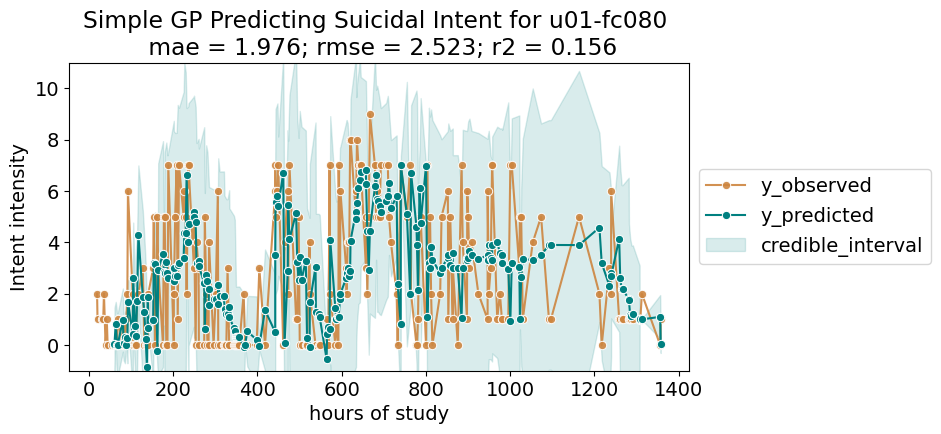

In [41]:
# set kernel 
#kernel = RBF(length_scale = 0.01) + RBF(length_scale = 1) + WhiteKernel(noise_level = 2) 
kernel = RBF() + ExpSineSquared() + WhiteKernel()

# fit model
y_preds, y_upper, y_lower, mae, rmse, r2 = fit_gp_ts_window(df = u01, ppt_id = 'u01-fc080', kernel = kernel, n_start = 10)

# plot 
plot_gp_ts(df = u01, ppt_id = 'u01-fc080', y_preds = y_preds, 
           y_lower = np.array(y_lower).reshape(-1), y_upper = np.array(y_upper).reshape(-1), 
           n_start = 10, mae = mae, rmse = rmse, r2 = r2)

## Loop through all patients 

Return lists of: 
- ppt_id (len = (n_obs per ppt - 20) * n_ppt) 
- y_preds (len = (n_obs per ppt - 20) * n_ppt) 
- y_upper (len = (n_obs per ppt - 20) * n_ppt) 
- y_lower (len = (n_obs per ppt - 20) * n_ppt) 
- mae (len = n_ppt)
- rmse (len = n_ppt)

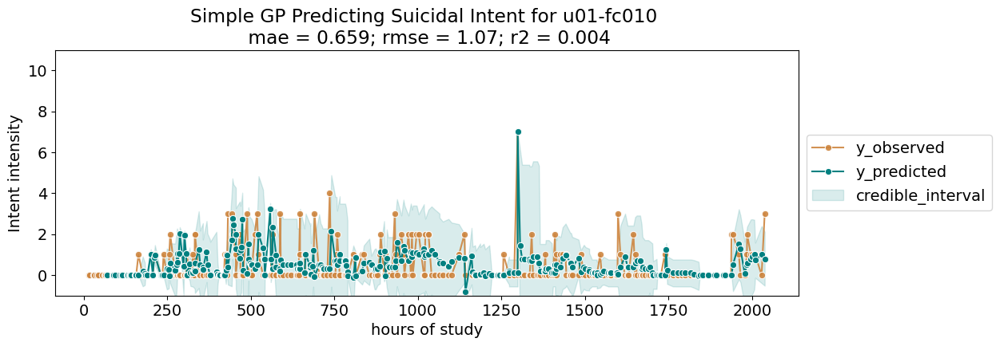

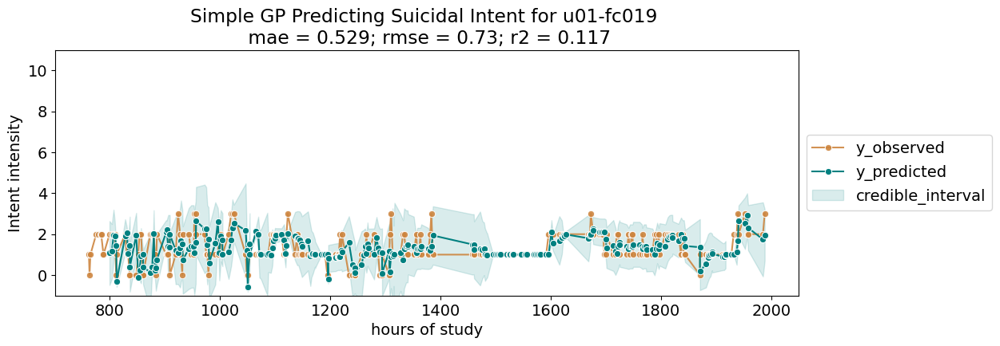

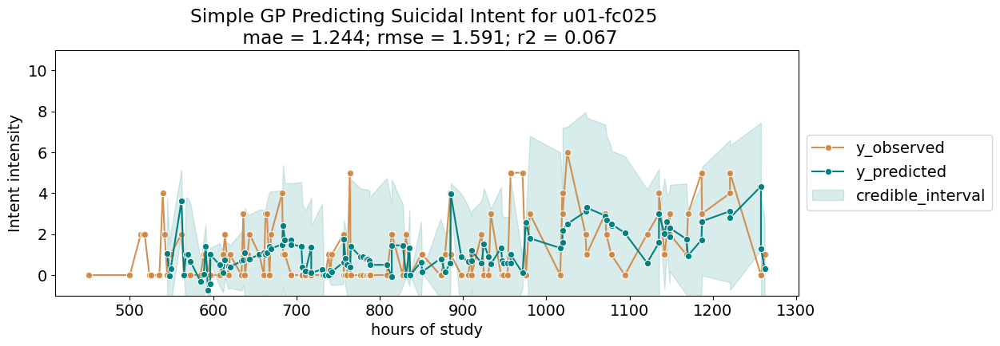

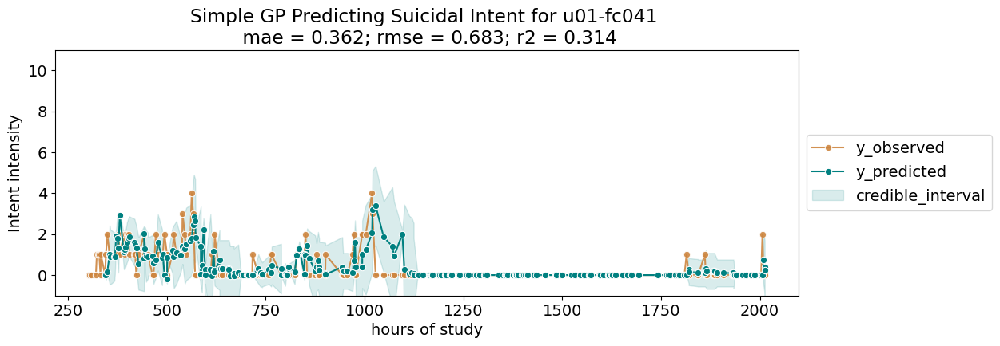

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


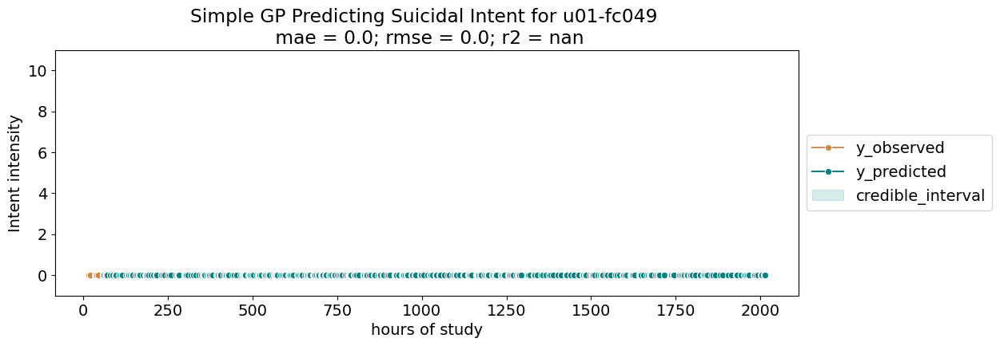

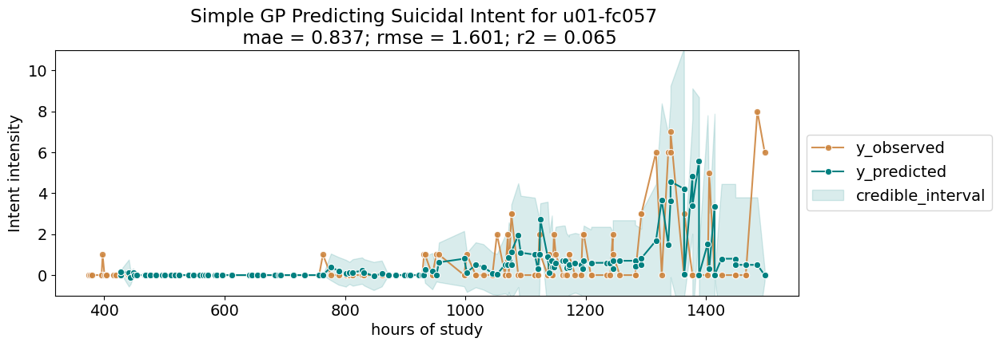

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


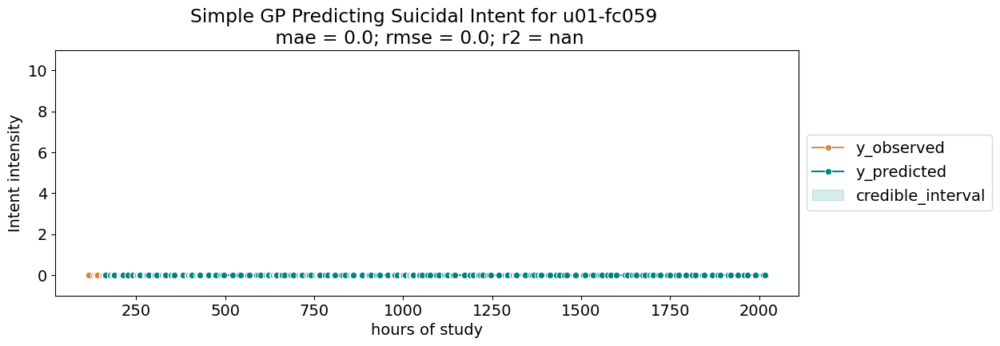

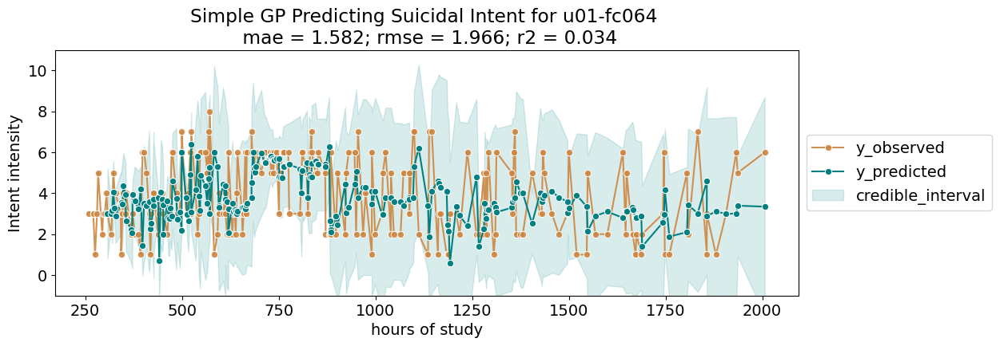

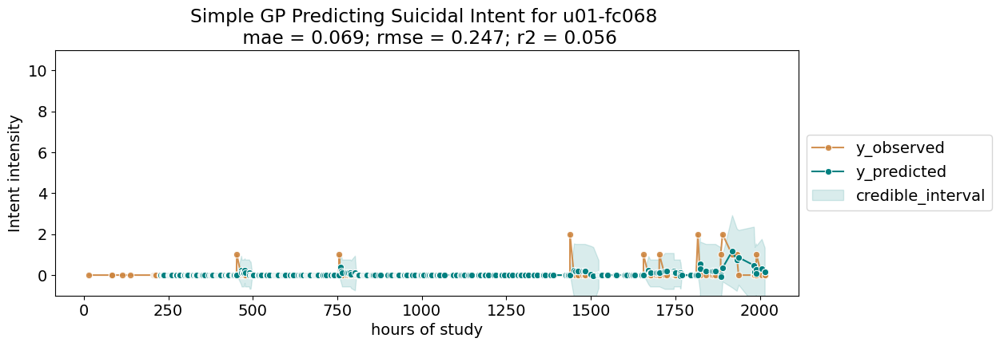

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


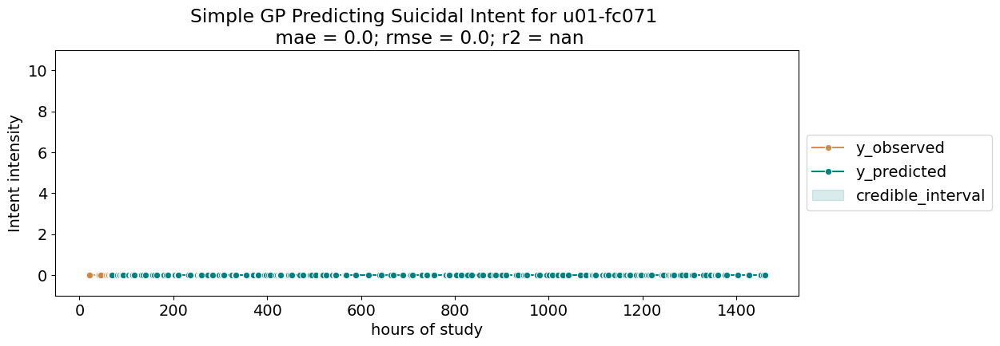

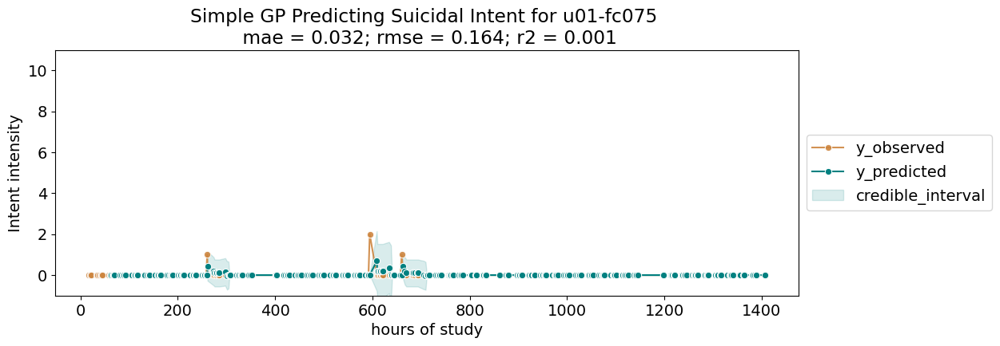

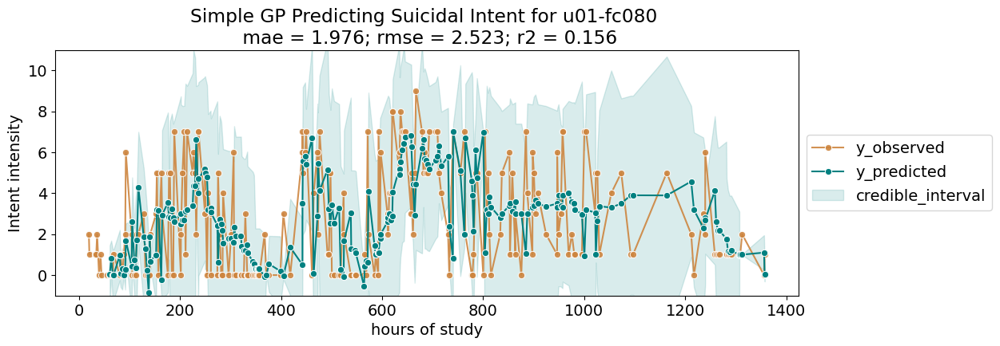

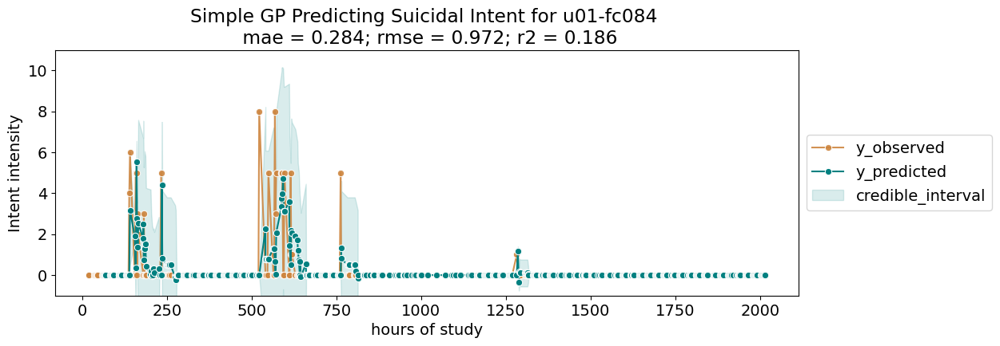

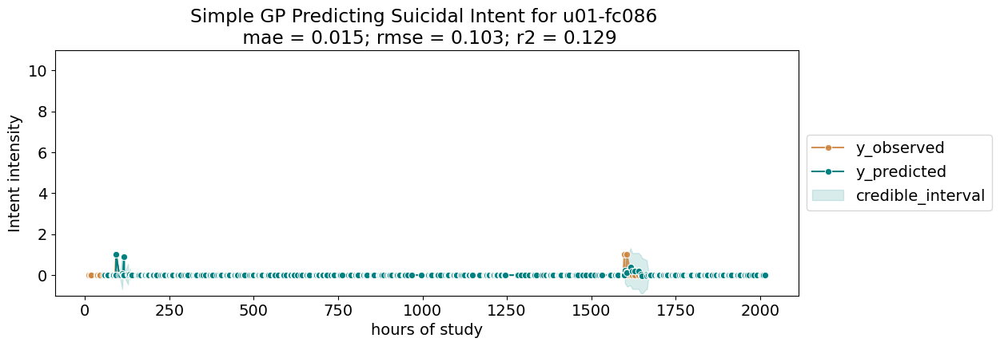

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


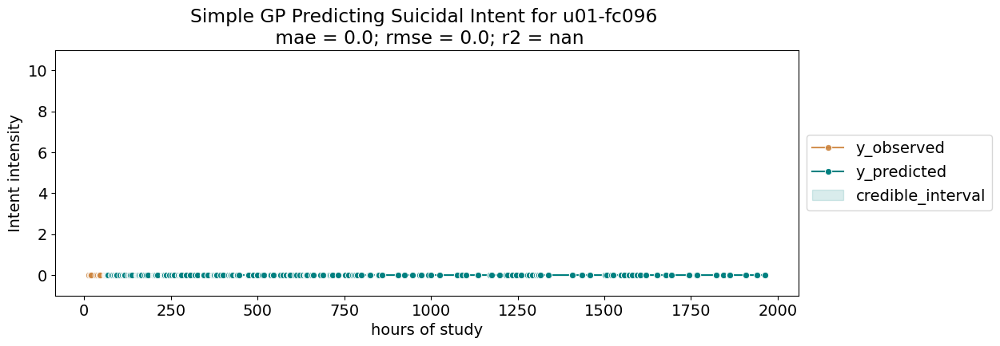

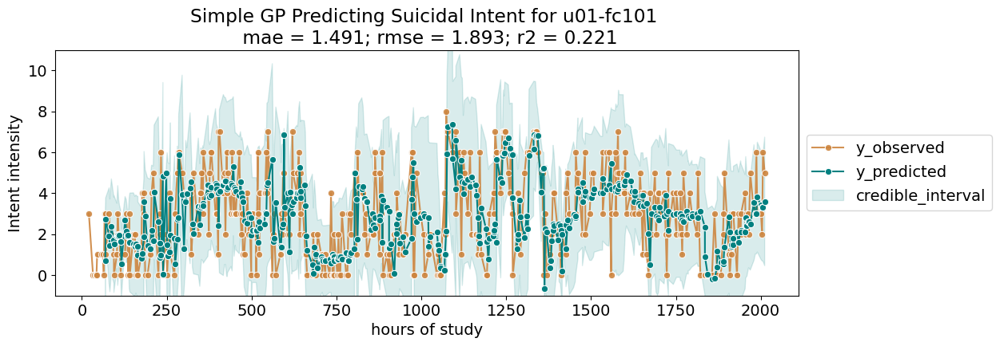

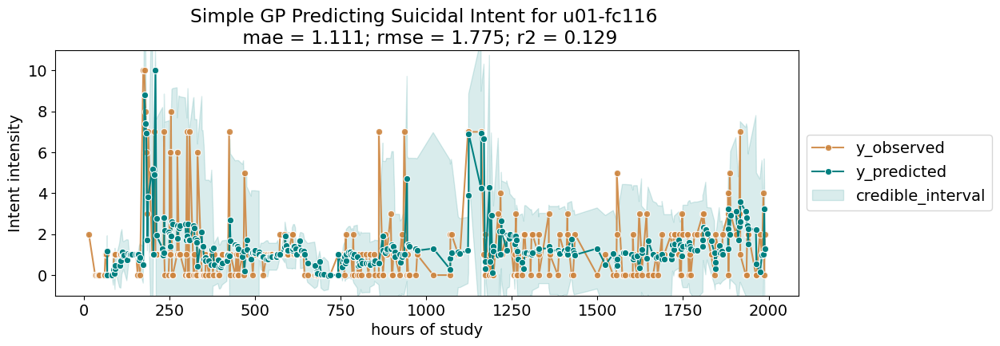

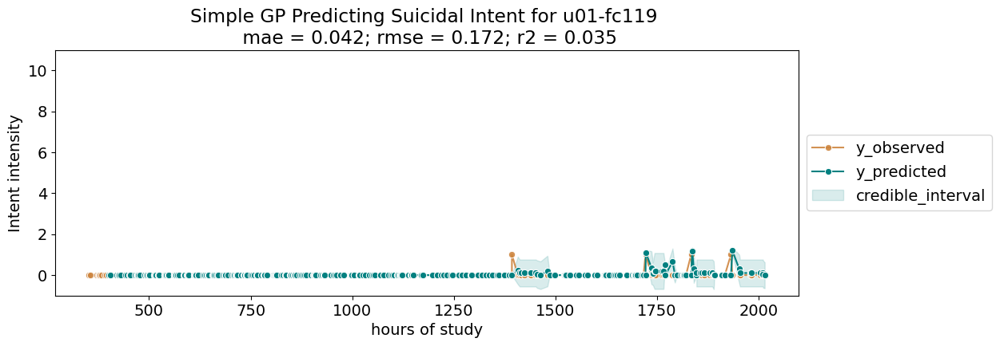

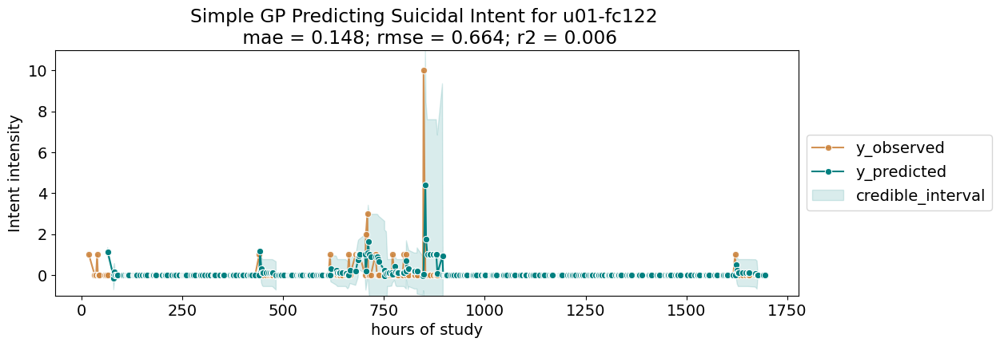

...

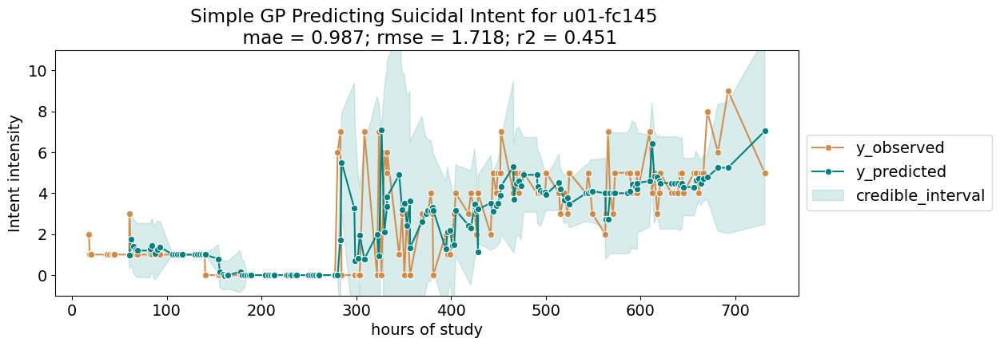

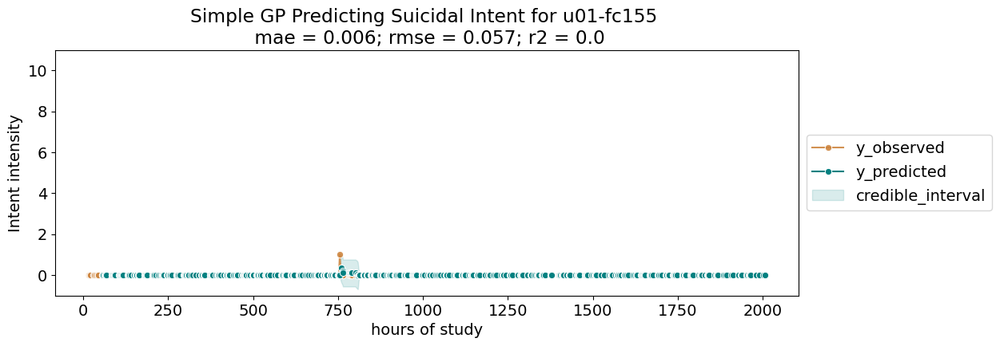

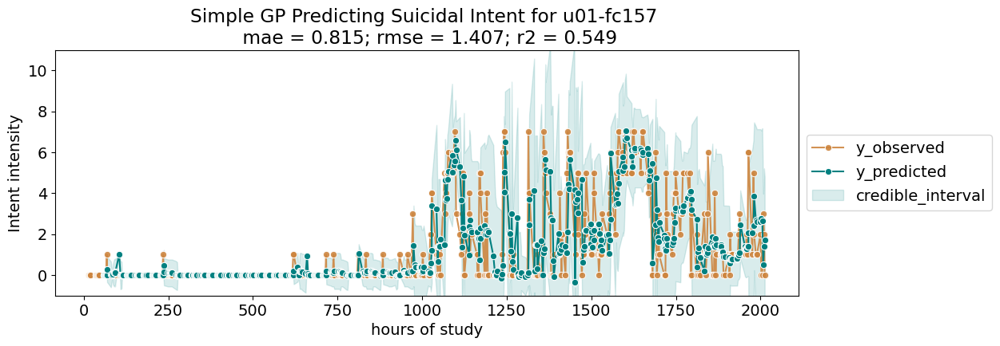

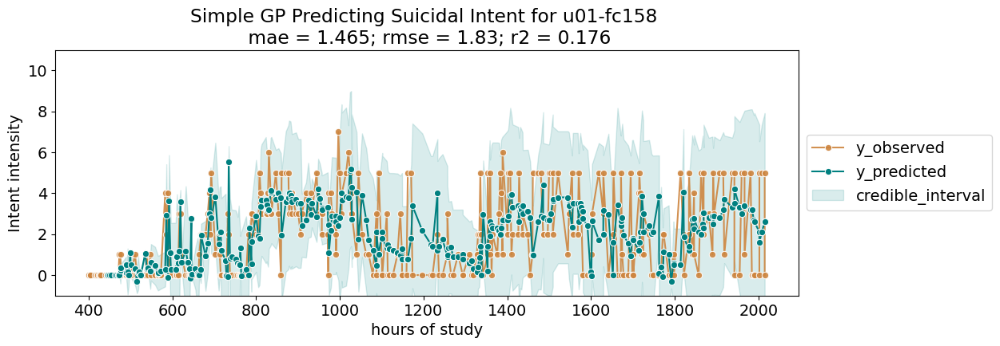

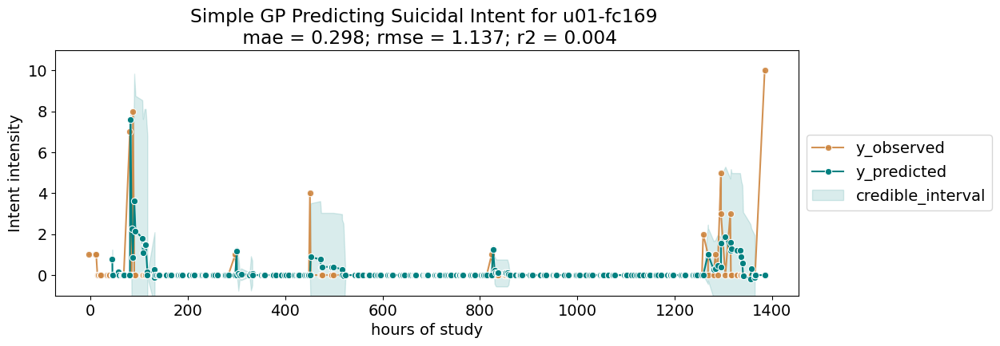

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


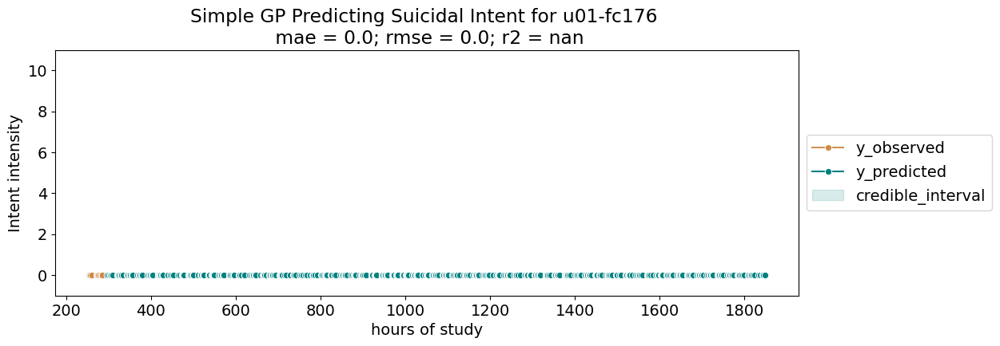

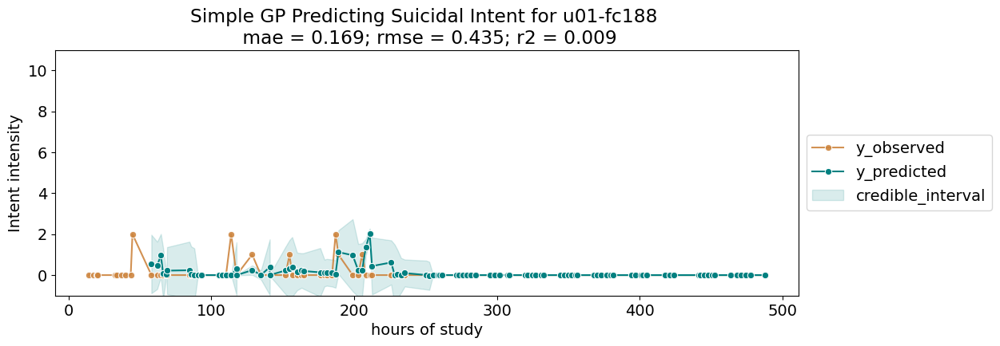

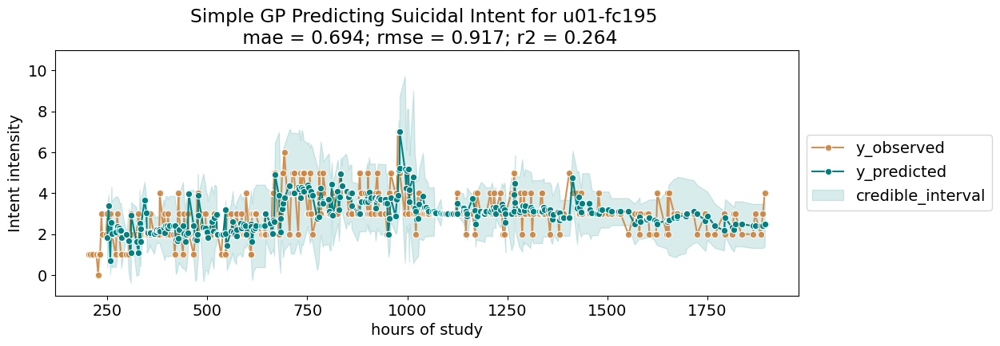

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


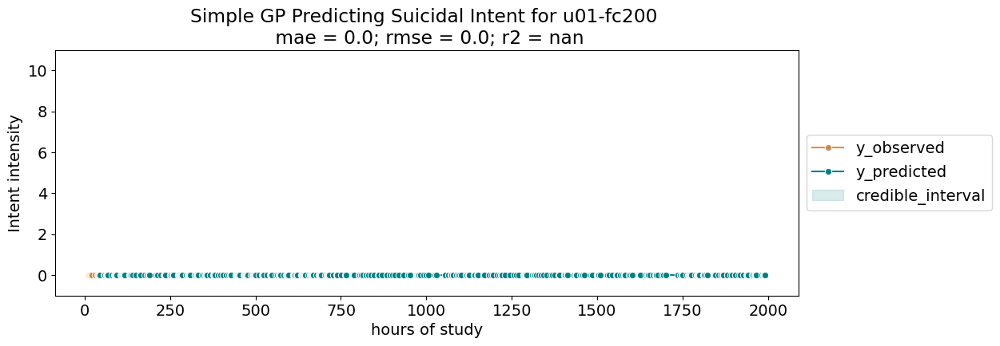

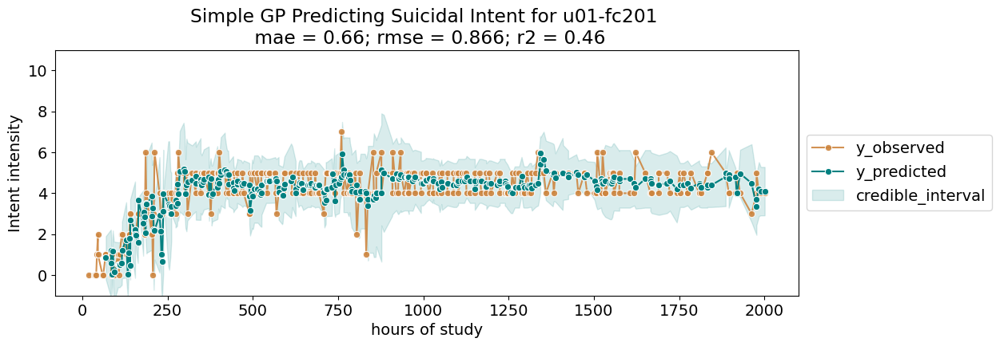

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


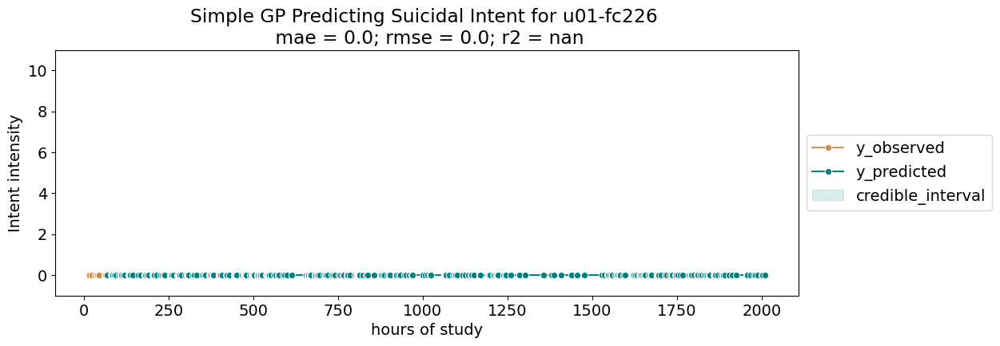

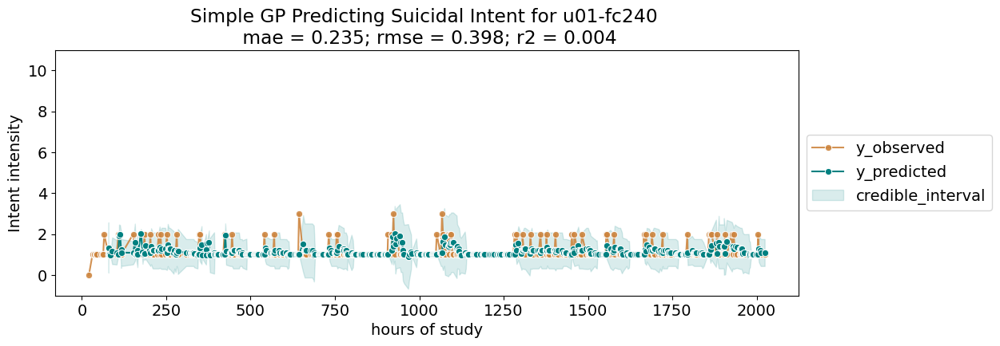

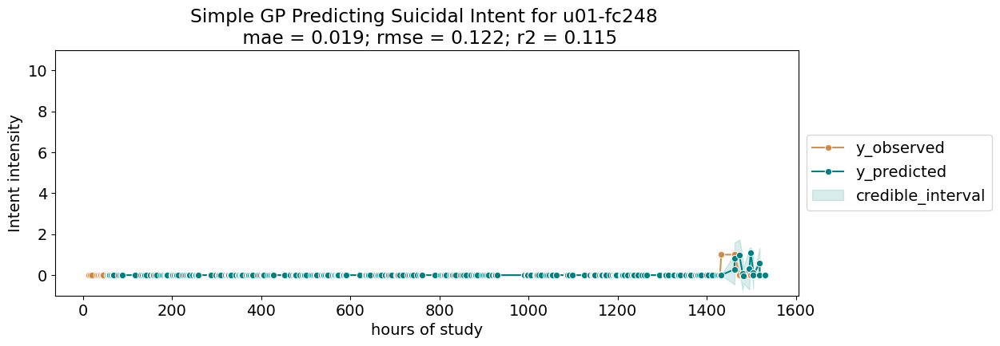

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


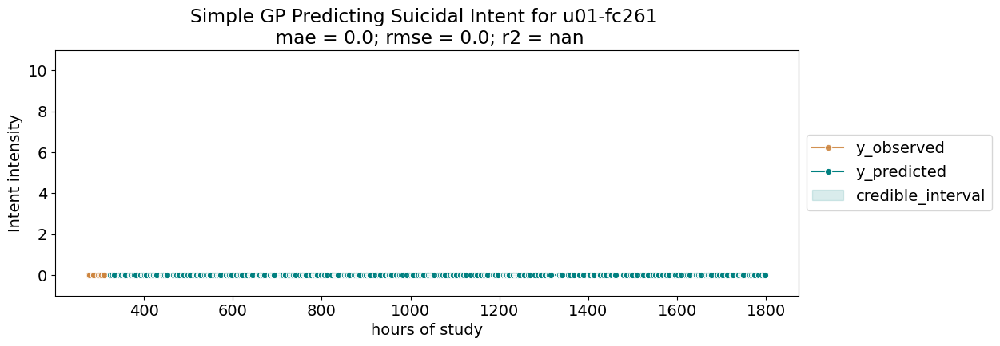

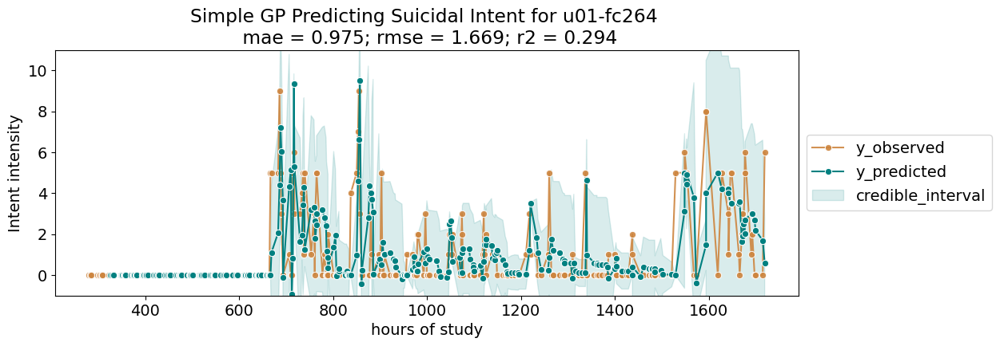

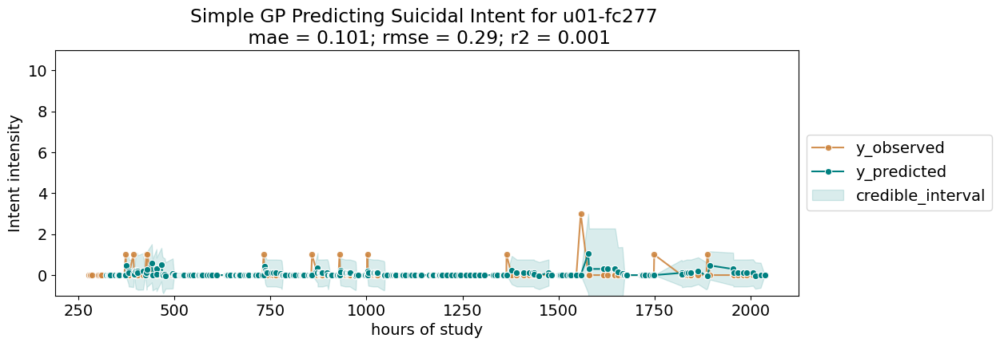

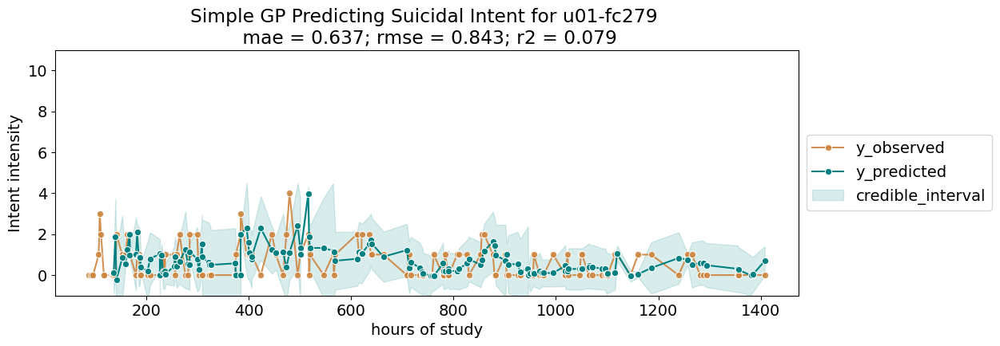

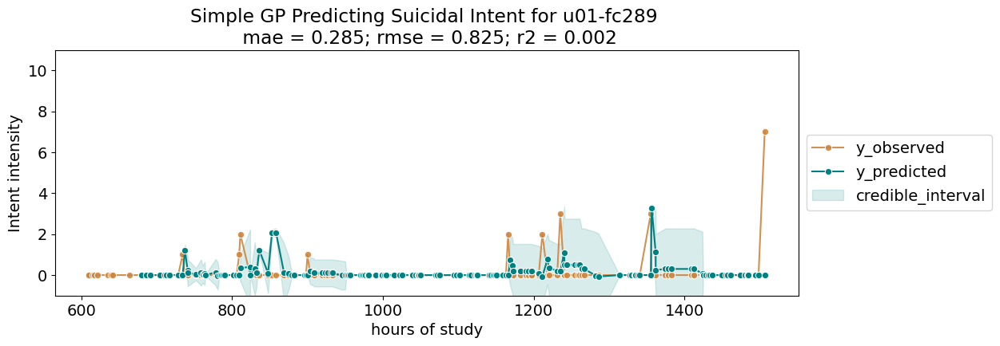

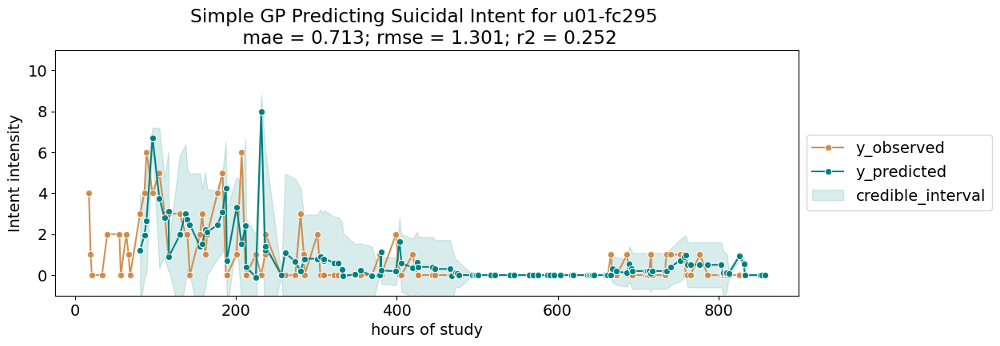

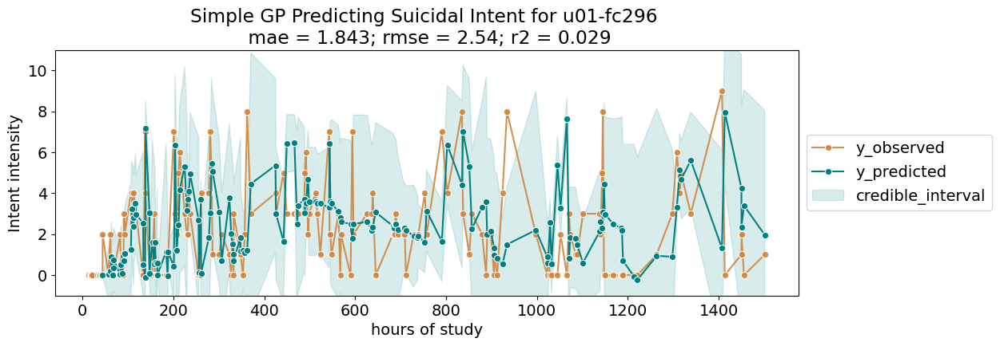

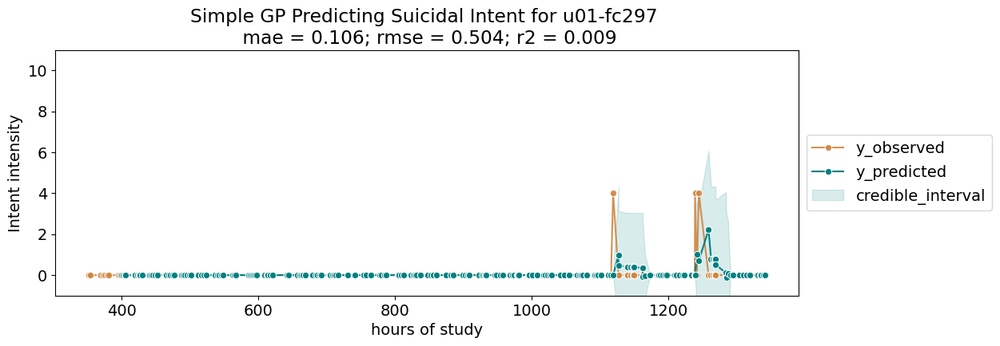

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


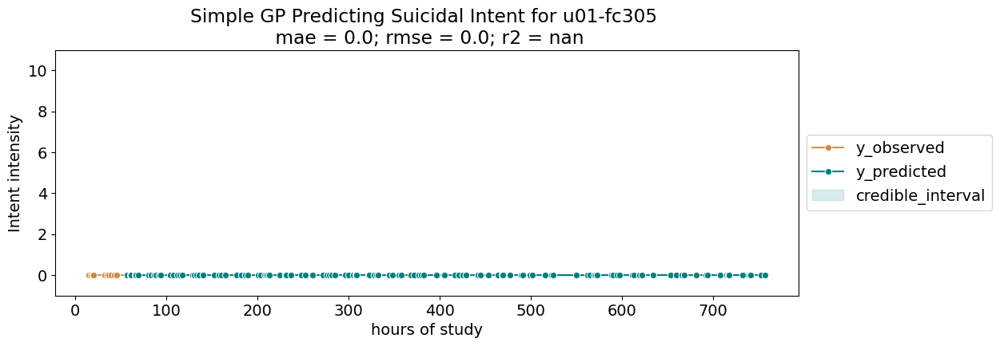

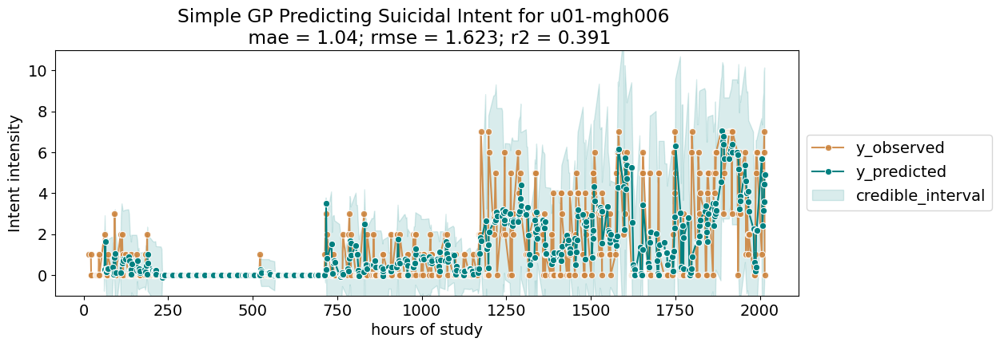

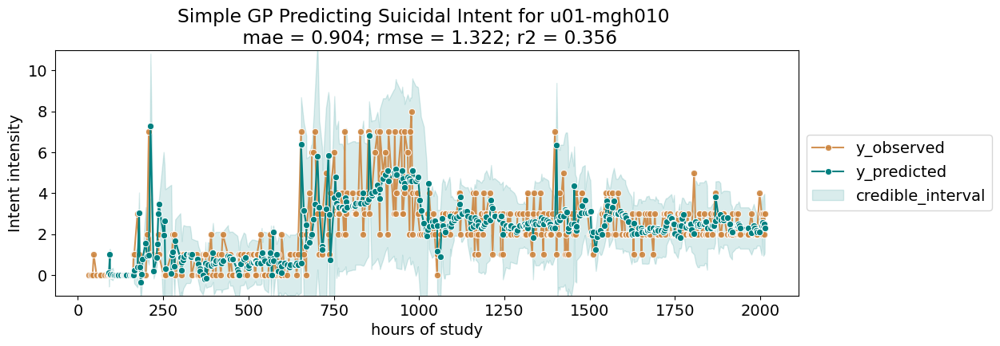

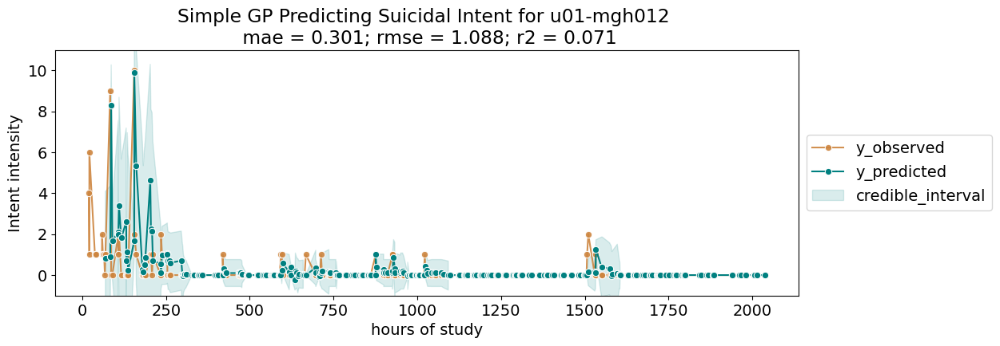

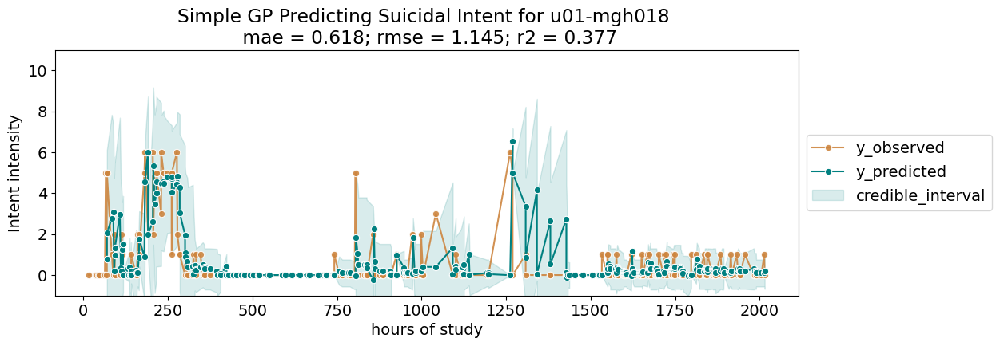

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


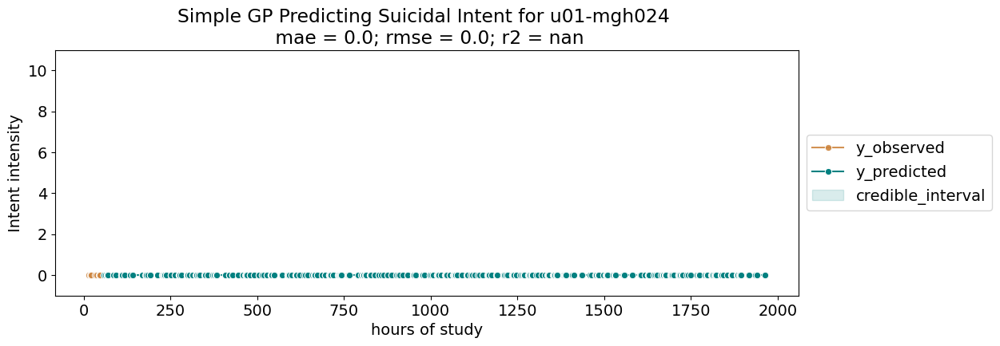

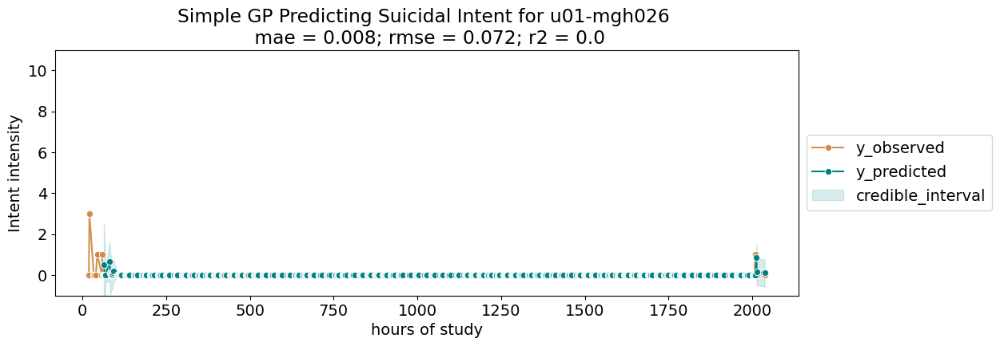

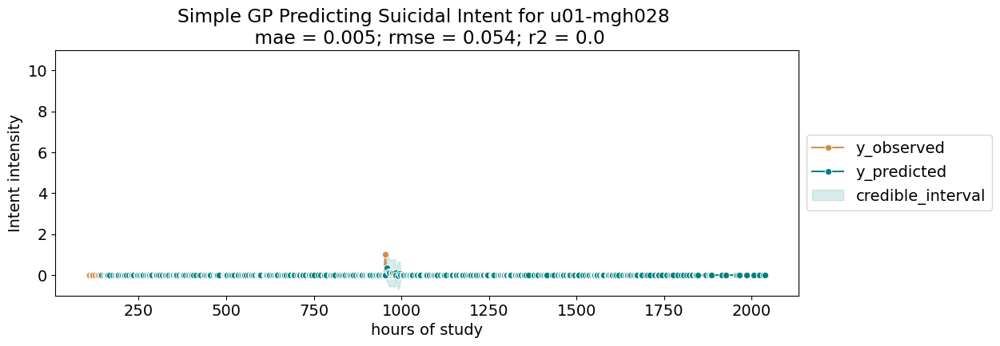

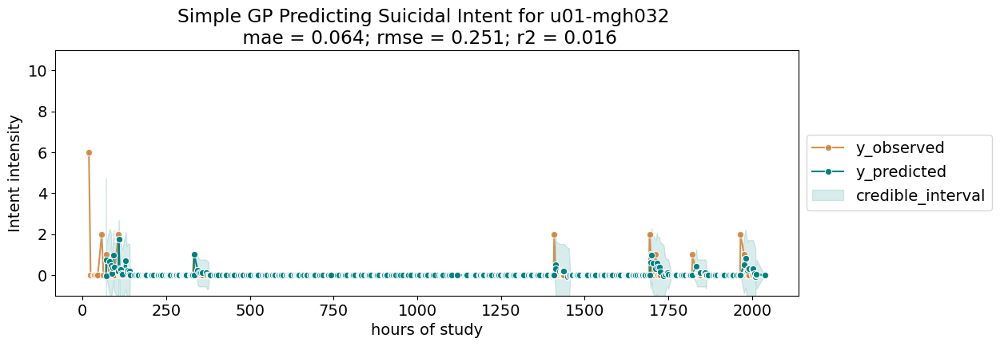

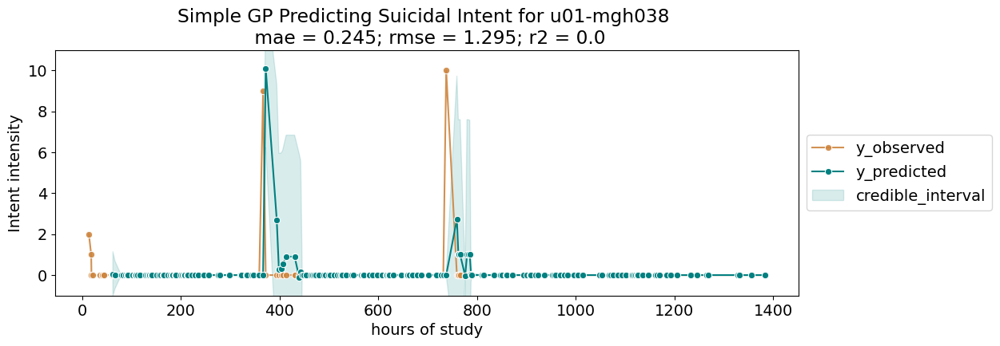

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


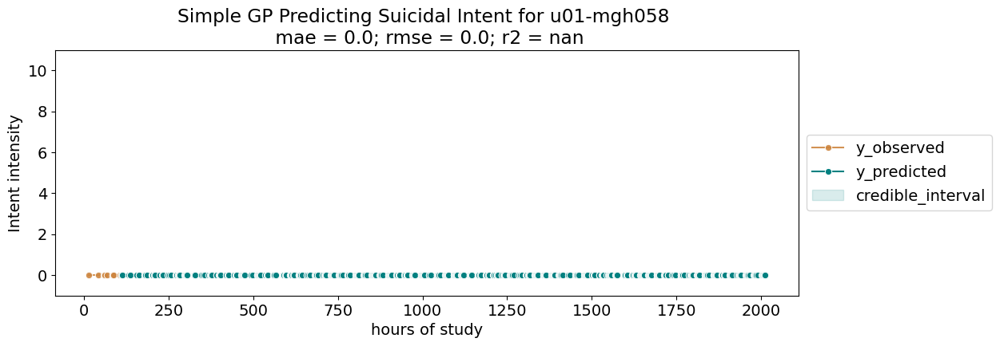

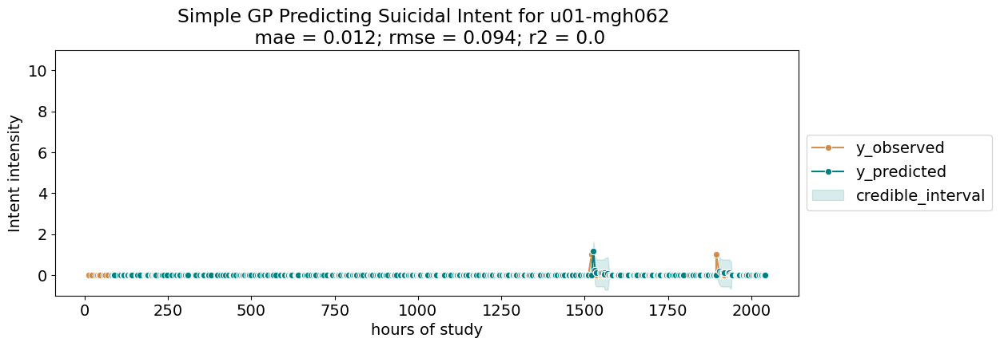

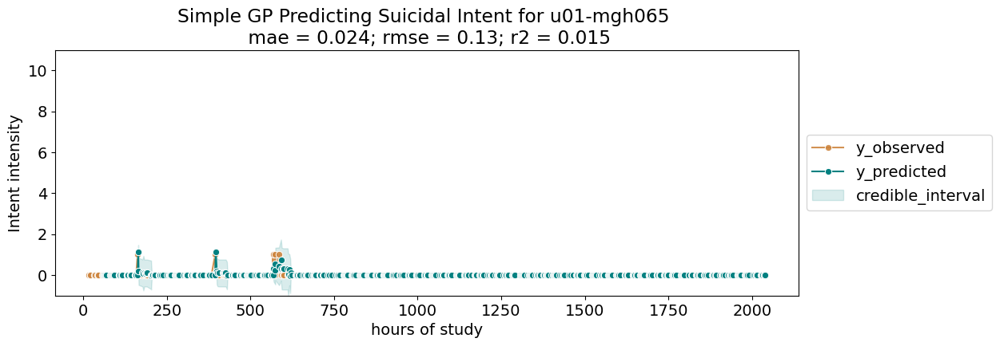

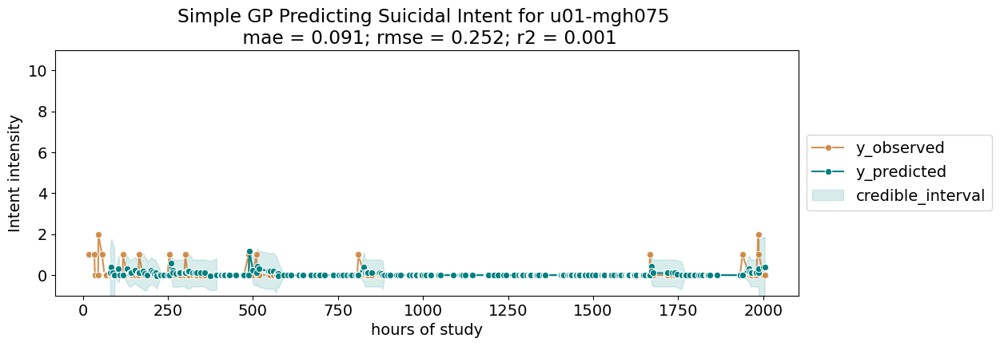

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


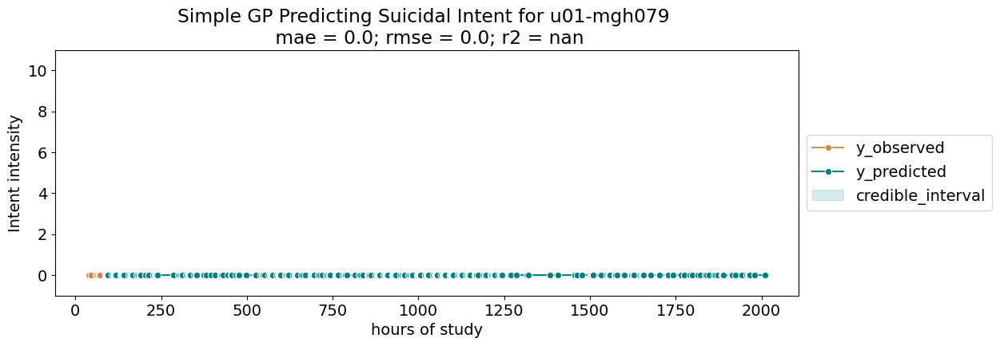

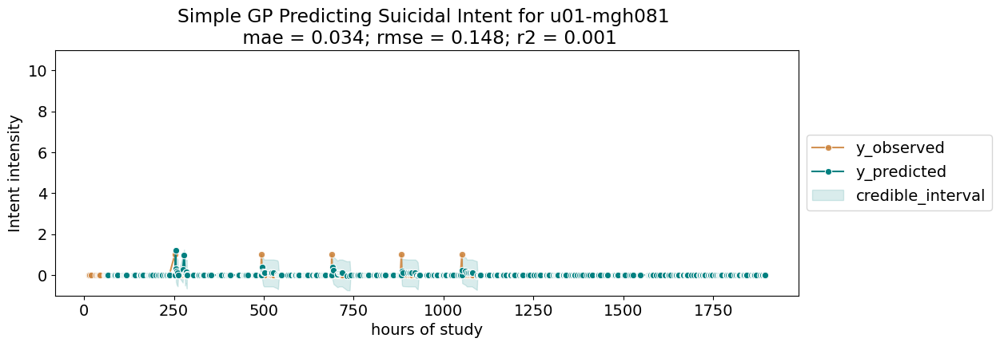

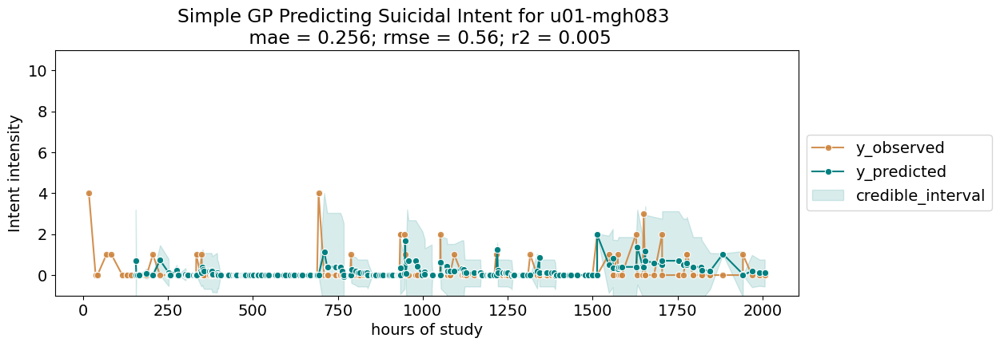

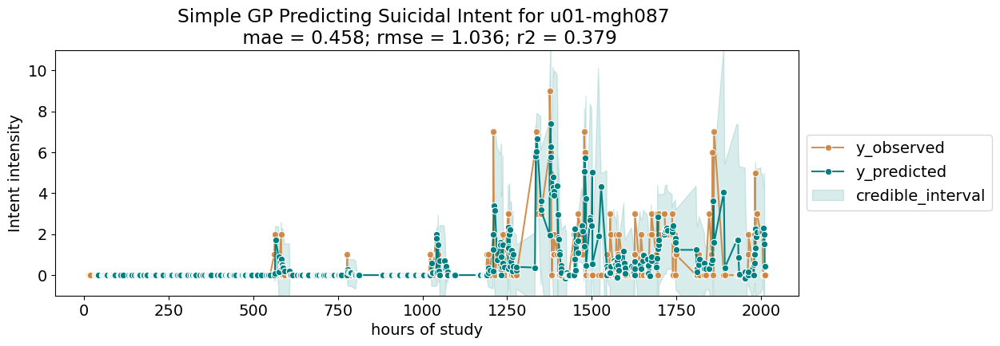

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


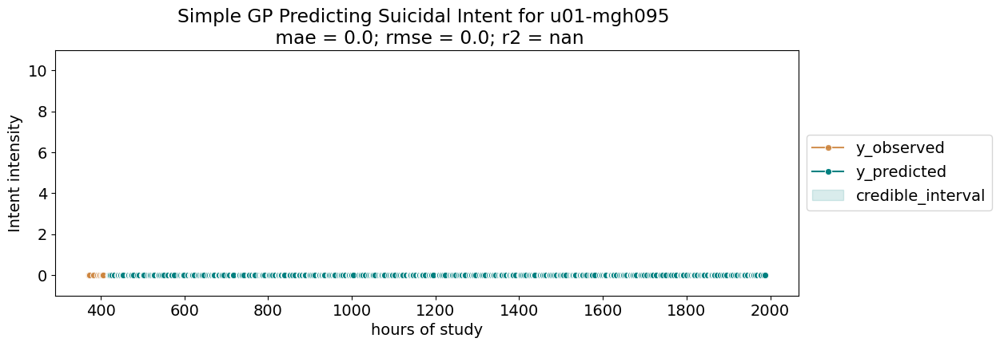

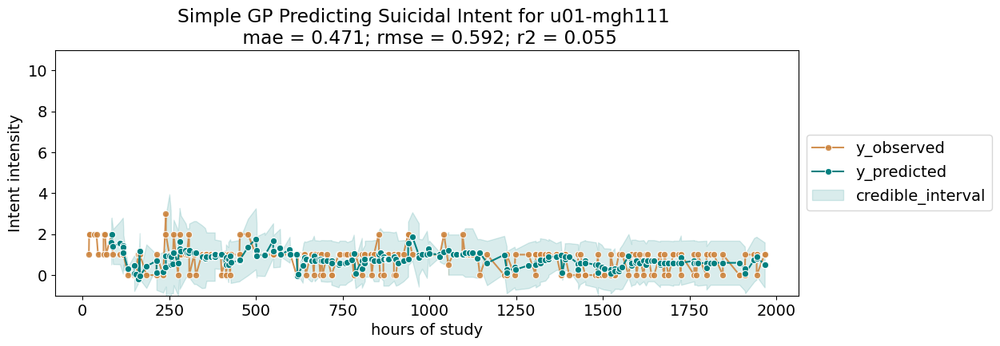

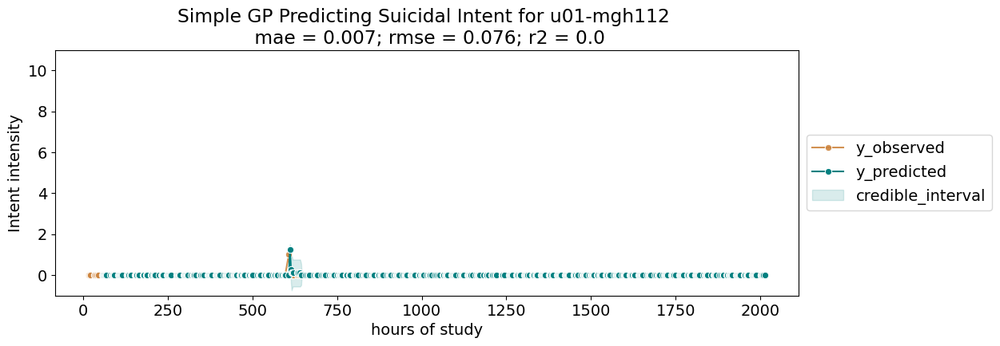

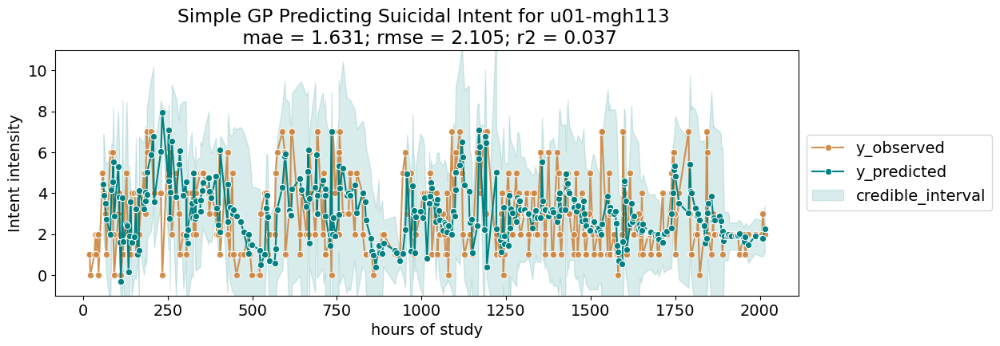

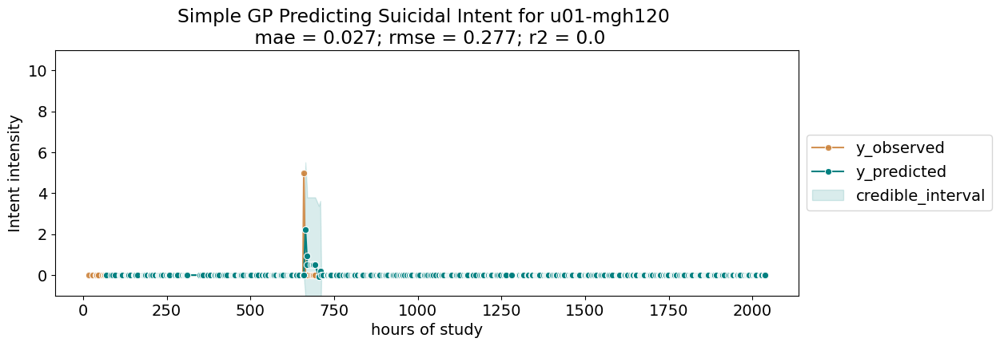

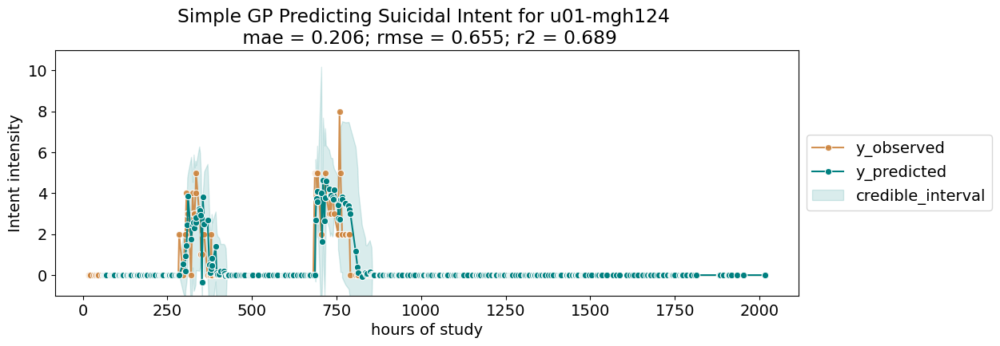

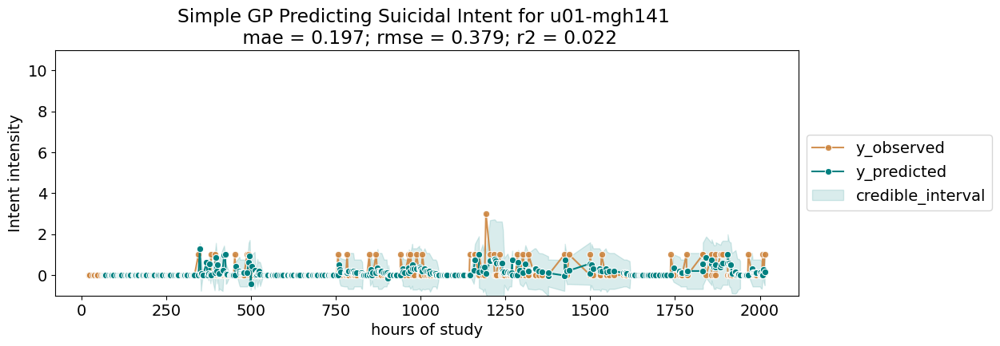

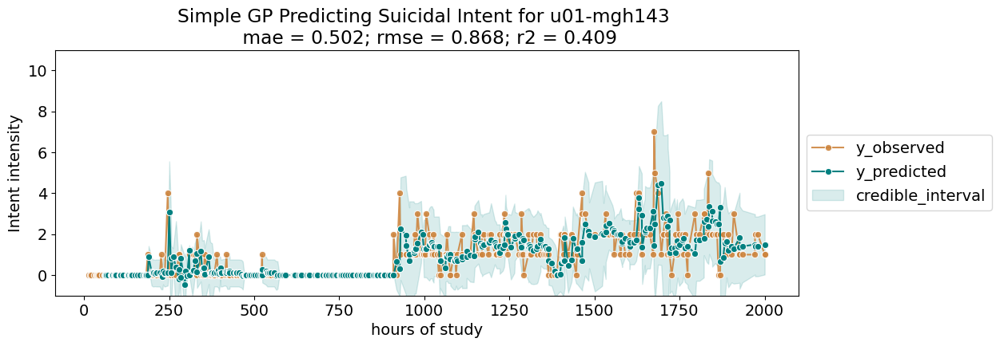

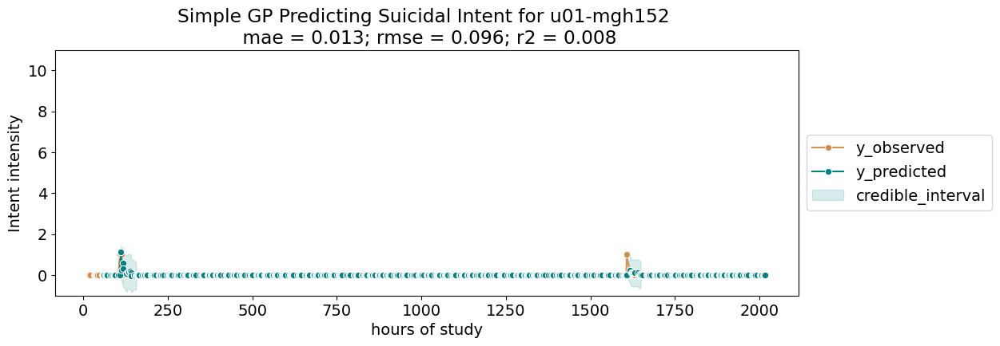

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


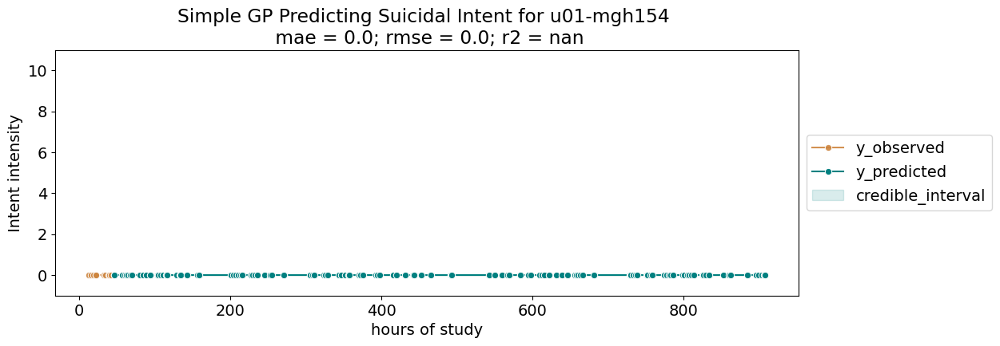

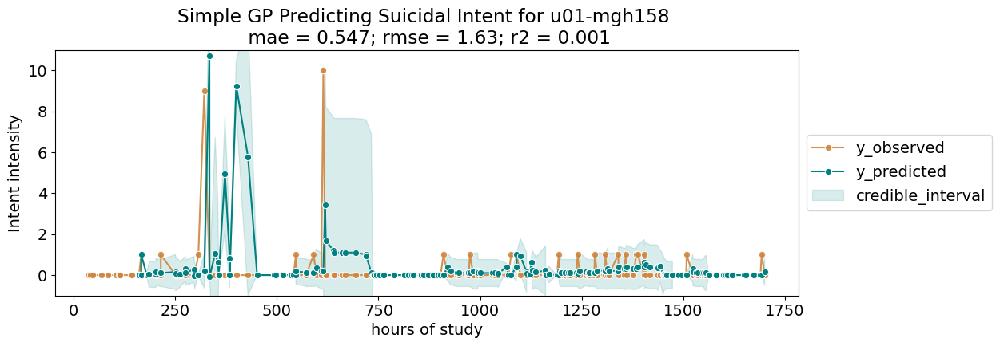

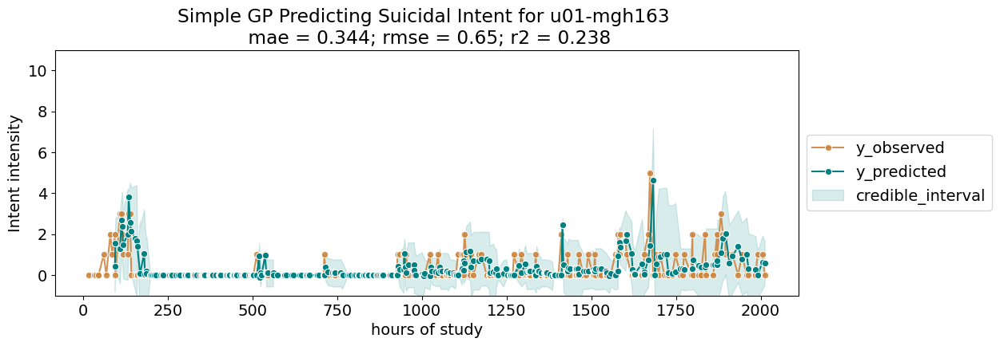

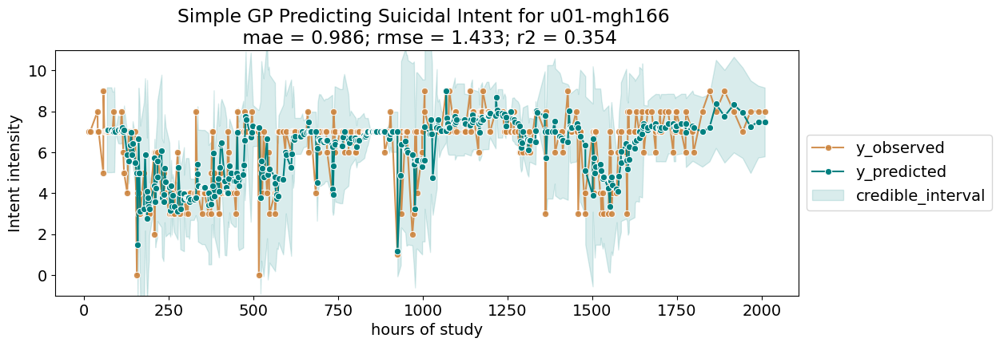

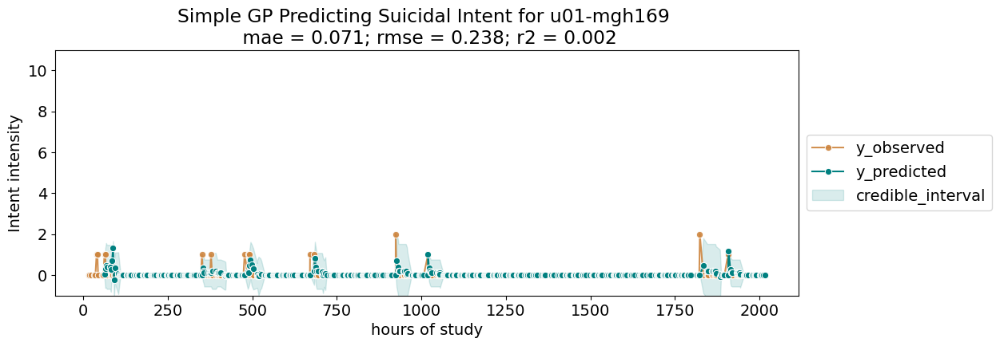

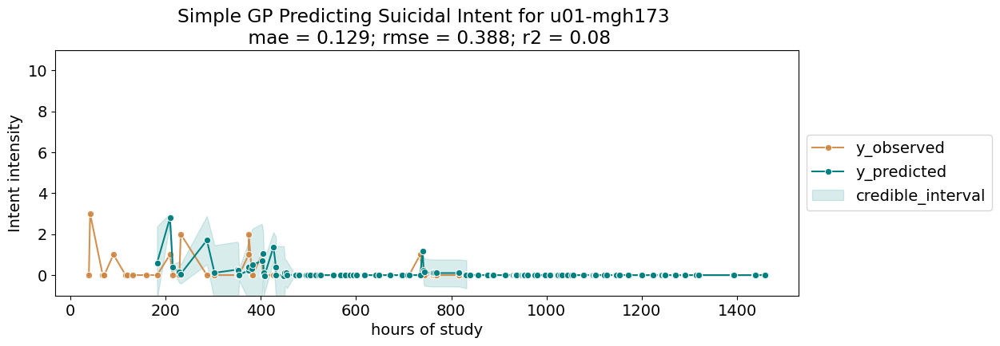

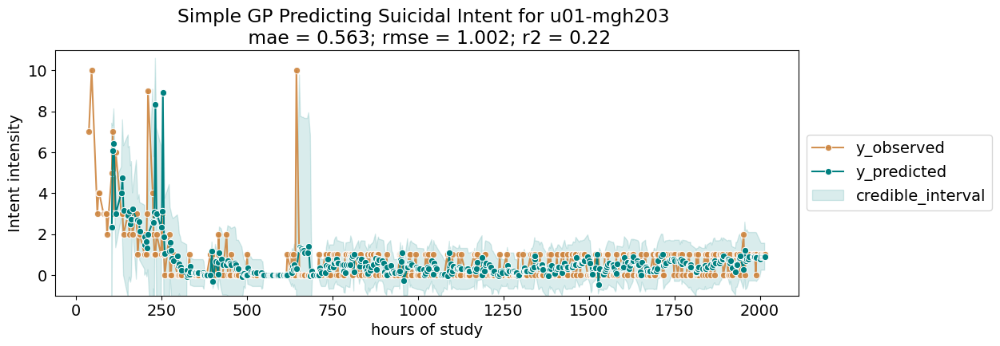

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


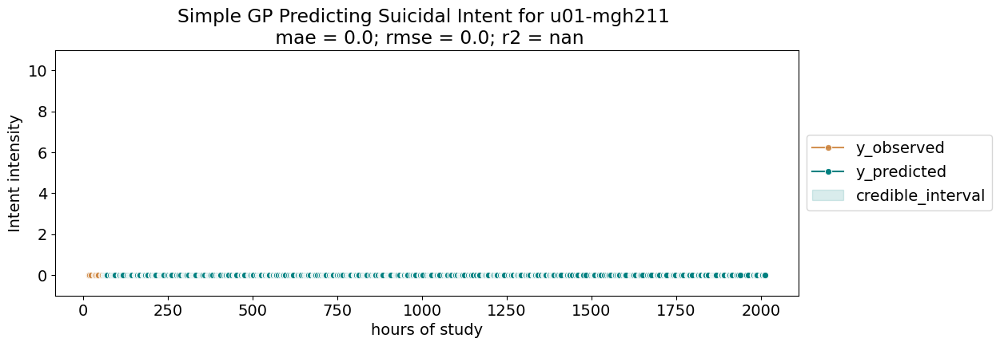

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


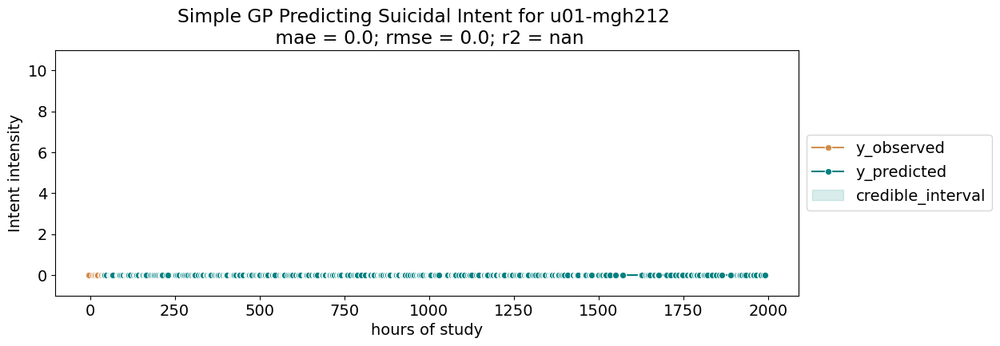

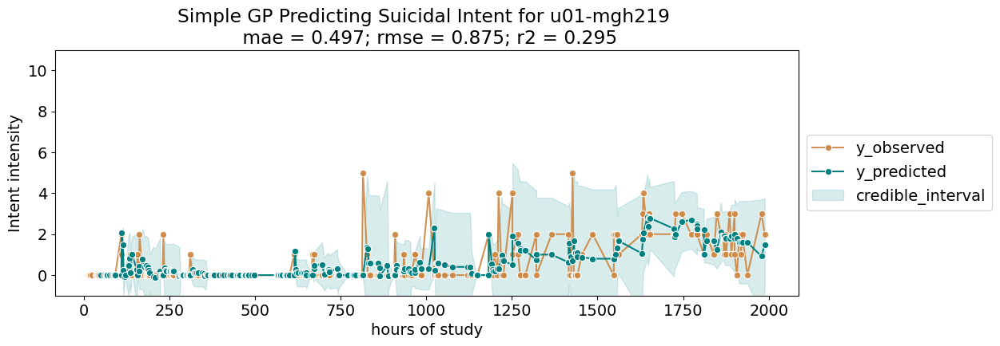

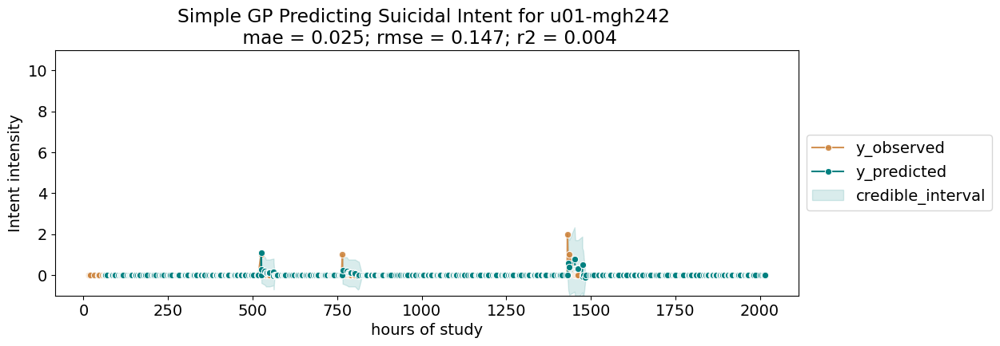

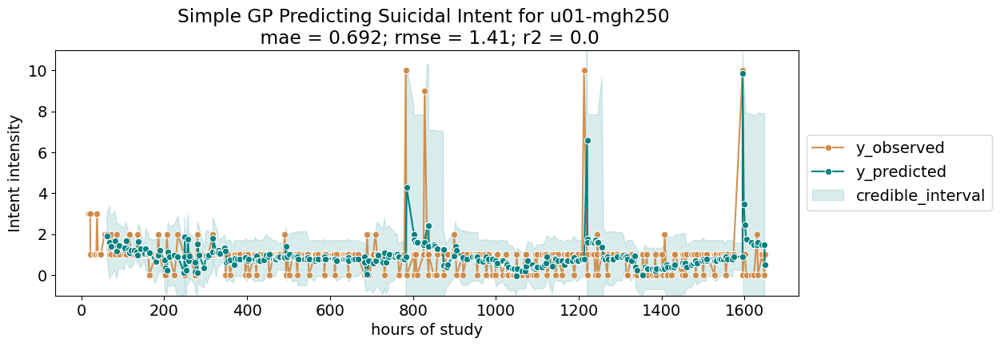

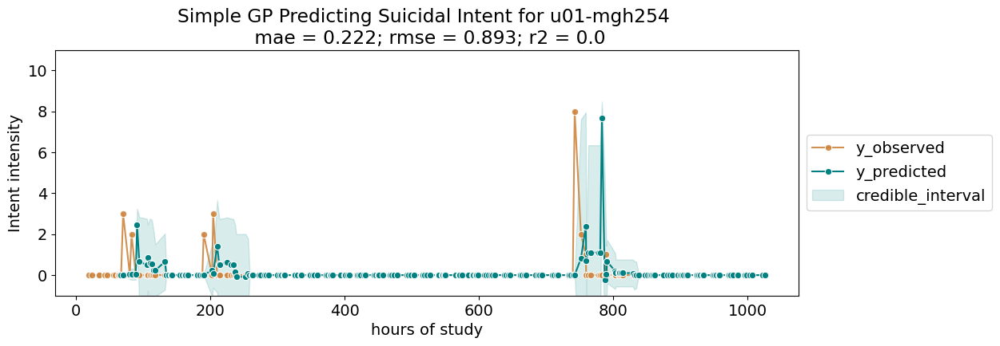

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2854: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


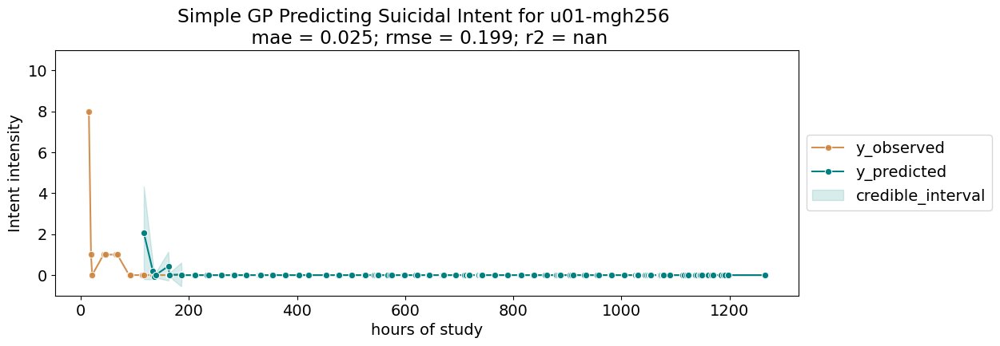

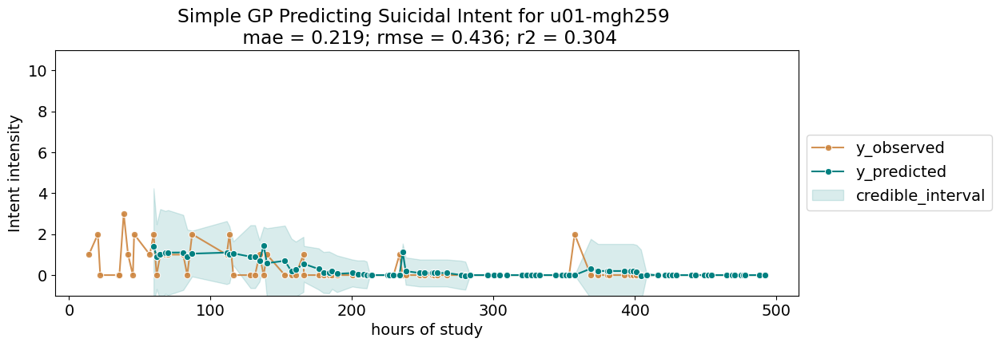

/usr/local/lib/python3.10/site-packages/numpy/lib/function_base.py:2853: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]


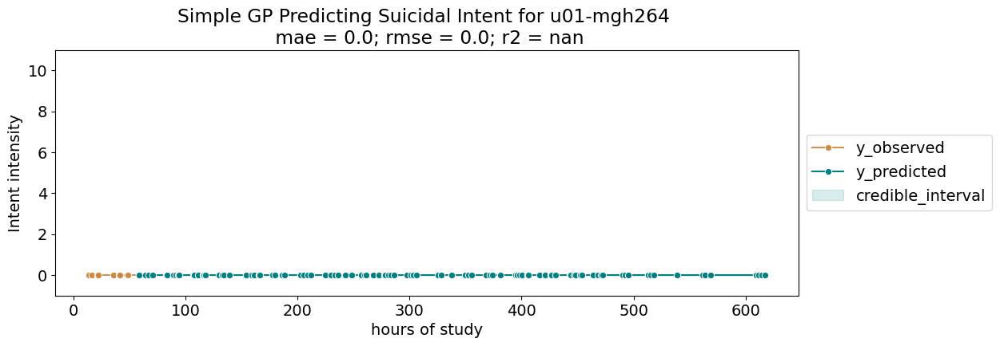

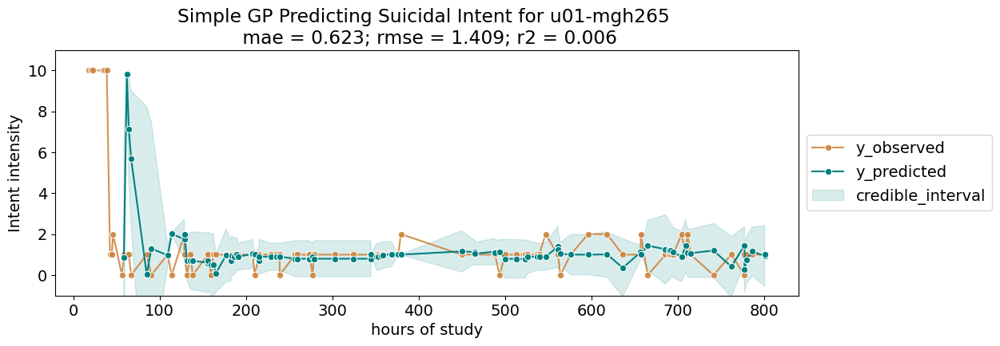

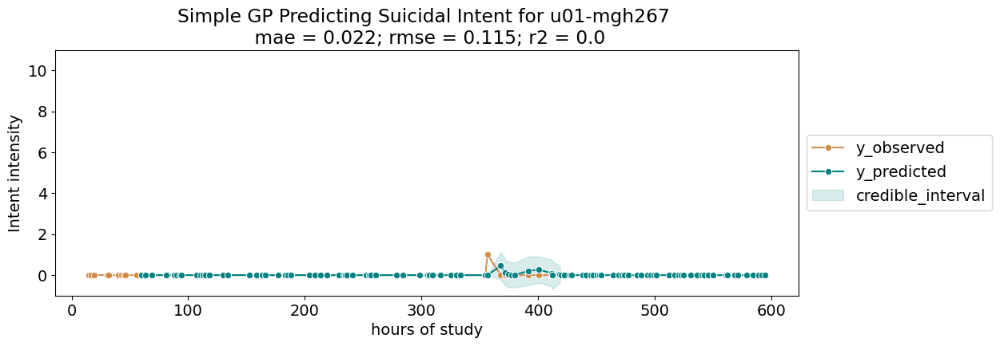

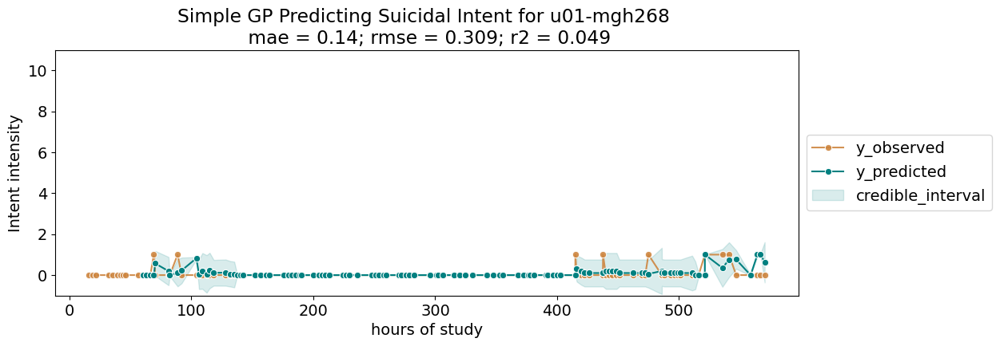

In [36]:
## initialize lists 
ppt_id_list = []
y_preds_list = []
y_upper_list = []
y_lower_list = []
mae_list = []
rmse_list = []
r2_list = []

## loop through participants 
for n_ppt, ppt in enumerate(u01['ppt_id'].unique()):
    
    # set kernel 
    kernel = RBF() + ExpSineSquared() + WhiteKernel()
    
    # fit model
    y_preds, y_upper, y_lower, mae, rmse, r2 = fit_gp_ts_window(df = u01, ppt_id = ppt, kernel = kernel, n_start = 10)
    
    # plot 
    plot_gp_ts(df = u01, ppt_id = ppt, y_preds = y_preds, 
               y_lower = np.array(y_lower).reshape(-1), y_upper = np.array(y_upper).reshape(-1), 
               n_start = 10, mae = mae, rmse = rmse, r2 = r2)
    
    # print and append y preds and metrics
    ppt_id_list.extend([ppt for i in range(len(y_preds))])
    y_preds_list.extend(y_preds)
    y_upper_list.extend(y_upper)
    y_lower_list.extend(y_lower)
    
    mae_list.append(mae)
    rmse_list.append(rmse)
    r2_list.append(r2)
    
    #print(f'{ppt}: mae = {round(mae, 3)}; rmse = {round(rmse, 3)}')

In [37]:
# metrics
unique_ids = u01['ppt_id'].unique().tolist()
metrics_df_whitekernel = pd.DataFrame(list(zip(unique_ids, mae_list, rmse_list, r2_list)), columns = ['ppt_id', 'mae', 'rmse', 'r2'])
metrics_df_whitekernel.to_csv("results/gp_intent_only_window.csv", index = False)

# describe
metrics_df_whitekernel.describe()

,mae,rmse,r2
count,89.000000,89.000000,71.000000
mean,0.376578,0.676264,0.123398
std,0.480755,0.677602,0.161910
min,0.000000,0.000000,0.000014
25%,0.013205,0.096401,0.002332
50%,0.169418,0.434801,0.037329
75%,0.623171,1.136545,0.220651
max,1.975970,2.539696,0.688617
